In [1]:
import numpy as np
%load_ext autoreload
%autoreload 2
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'png' 

import matplotlib.lines as mlines
import seaborn
matplotlib.rcParams['figure.figsize'] = (12.0, 3.0)
matplotlib.rcParams['font.size'] = 7
seaborn.set_style('darkgrid')

from braindecode.scripts.print_results import ResultPrinter
from braindecode.csp.print_results import CSPResultPrinter
import logging
log = logging.getLogger()
log.setLevel("DEBUG")
from braindecode.scripts.train_experiments import setup_logging
setup_logging()

Using gpu device 0: GeForce GTX 780 (CNMeM is disabled, cuDNN 5005)
/home/hartmank/braindecode/vienv/local/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
from braindecode.experiments.load import load_exp_and_model
from braindecode.veganlasagne.layer_util import print_layers, recompute_bnorm_layer_statistics
import lasagne

In [3]:
savepath = 'models/paper/ours/cnt/deep4/243'
exp, model = load_exp_and_model('../data/models/paper/ours/cnt/deep4/243', set_invalid_to_NaN=False)
%cd ../

2016-11-24 16:31:06,982 Setting n_sample preds automatically to 479
2016-11-24 16:31:06,983 Input window length is 522
2016-11-24 16:31:07,060 Setting n_sample preds automatically to 479
2016-11-24 16:31:07,061 Input window length is 522
/home/hartmank/braindecode


"Conv2DAllColsLayer" is just a normal conv2d-layer which dynamically is assigned the filter size of 1x(4th input dim).
Should be replacable by normal Conv2DLayer if needed.

In [4]:
from braindecode.veganlasagne.layers import FinalReshapeLayer
print model
all_l = lasagne.layers.get_all_layers(model)
model = all_l[-3]
model = FinalReshapeLayer(model,remove_invalids=True,flatten=False)
model = lasagne.layers.DimshuffleLayer(model,(0,2,1,3))
model = lasagne.layers.ReshapeLayer(model,(-1,4))
model = lasagne.layers.NonlinearityLayer(model,nonlinearity=lasagne.nonlinearities.softmax)

In [5]:
print_layers(model)

 0-InputLayer                                                         [None, 44, 1000, 1]
 1-DimshuffleLayer                                                    (None, 1, 1000, 44)
 2-DropoutLayer             0.000                                    
 3-Conv2DLayer              10x1                                      (None, 25, 991, 44)
 4-Conv2DAllColsLayer       1x44                                      (None, 25, 991, 1)
 5-BatchNormLayer                                     elu            
 6-Pool2DLayer              3x1                       max             (None, 25, 989, 1)
 7-StrideReshapeLayer           ::3 ::1                               (None, 25, 330, 1)
 8-NonlinearityLayer                                                 
 9-DropoutLayer             0.500                                    
10-Conv2DLayer              10x1                                      (None, 50, 321, 1)
11-BatchNormLayer                                     elu            
12-Pool2DLayer          

### Load and get data

In [6]:
exp.dataset.load()

2016-11-24 16:31:07,117 Load Training Set...
2016-11-24 16:31:25,924 Load Test Set...
2016-11-24 16:31:29,400 Clean Training Set...
2016-11-24 16:31:30,021 Rejected channels: []
2016-11-24 16:31:30,022 #Clean trials:     895
2016-11-24 16:31:30,022 #Rejected trials:  2
2016-11-24 16:31:30,023 Fraction Clean:    99.0%
2016-11-24 16:31:30,023 (from maxmin):     2
2016-11-24 16:31:30,024 (from var):        0
2016-11-24 16:31:30,201 Clean Test Set...
2016-11-24 16:31:30,312 Rejected channels: []
2016-11-24 16:31:30,313 #Clean trials:     160
2016-11-24 16:31:30,313 #Rejected trials:  0
2016-11-24 16:31:30,314 Fraction Clean:    100.0%
2016-11-24 16:31:30,314 (from maxmin):     0
2016-11-24 16:31:30,315 (from var):        0
2016-11-24 16:31:30,315 Create Cleaned Cnt Sets...
2016-11-24 16:31:31,451 Create sets from cleaned cnt...
2016-11-24 16:31:31,452 Preprocess continuous signal...
2016-11-24 16:31:50,960 Not doing any bandpass, since low 0 or None and high None
2016-11-24 16:32:05,346 Lo

In [7]:
datasets = exp.dataset_provider.get_train_merged_valid_test(exp.dataset)

In [8]:
test_batches = list(exp.iterator.get_batches(datasets['test'], shuffle=False))

### Just for showing how to make some predictions

In [29]:
%cd '/home/hartmank/braindecode/convvisual'
from convvisual import *
import os
import pickle

from braindecode.veganlasagne.layers import create_pred_fn
model = lasagne.layers.get_all_layers(model)

figpath = os.path.join('/home/hartmank/data/convvisual/figures',savepath)
datpath = os.path.join('/home/hartmank/data/convvisual/RF_data',savepath)
if not os.path.isdir(figpath):
    os.makedirs (figpath)
if not os.path.isdir(datpath):
    os.makedirs (datpath)

layer_list = [3,5,11,17,23,28]
X_reshapes = [None,None,None,None,None,81]
b = 0
for inputs, targets in test_batches:
    b += 1
    for layer,X_reshape in zip(layer_list,X_reshapes):
        RF_model,RF_layer = check_if_finalreshape_is_needed(model,layer)
        pred_fn = create_pred_fn(RF_model)
        output = pred_fn(inputs)
        #Get highest input/unit activation combination
        l_RF = receptive_field_build_deconv_layers(RF_model[RF_layer],RF_model[1],
                                                       use_learned_W=False,X_reshape=X_reshape)
        
        max_ind = list()
        for filter in range(2):
            max_ind.append(get_most_active_units_in_layer_from_output(output,RF_layer,filter,n_units=10,abs_act=False))
            
        max_ind = np.asarray(max_ind)
        max_ind_shape = max_ind.shape
        max_ind = max_ind.reshape((1,-1,max_ind_shape[2])).squeeze()
        
        X_RF_complete,mask = get_receptive_field_masked_inputs(inputs,max_ind,l_RF)
        X_RF_shape = X_RF_complete.shape
        X_RF_complete = X_RF_complete.reshape(max_ind_shape[0],-1,X_RF_shape[1],X_RF_shape[2],X_RF_shape[3])
        X_RF_complete.shape
        
        pkl = open(os.path.join(datpath,'Batch%d_Layer%02d.data'%(b,layer)), 'w')
        savedata = {'Input':inputs,'Targets':targets,'X_RF':X_RF_complete}
        pickle.dump(savedata,pkl)
        for filter in range(2):
            X_RF_tmp = X_RF_complete[filter]
            figpath_tmp = os.path.join(figpath,'Layer%02d/Filter%03d'%(layer,filter))
            if not os.path.isdir(figpath_tmp):
                os.makedirs (figpath_tmp)
                
            #max_ind = get_most_active_units_in_layer_from_output(output,layer,n_units=10,filter=filter,abs_act=False)
            
            #X_RF_complete,mask = get_receptive_field_masked_inputs(inputs,max_ind,l_RF)
             
            fname = os.path.join(figpath_tmp,'Batch%d.png'%(b))
            print fname
            f = plt.figure()
            figh = f.get_figheight()
            f.set_figheight(figh*X_RF_tmp.shape[1])
            for c in range(X_RF_tmp.shape[1]):
                ax = f.add_subplot(X_RF_tmp.shape[1],1,c+1)
                ax.plot(X_RF_tmp[:,c,:,:].squeeze().T)
            f.tight_layout()
            f.savefig(fname)
            plt.close()

/home/hartmank/braindecode/convvisual
/home/hartmank/data/convvisual/figures/models/paper/ours/cnt/deep4/243/Layer03/Filter000/Batch1.png
/home/hartmank/data/convvisual/figures/models/paper/ours/cnt/deep4/243/Layer03/Filter001/Batch1.png
/home/hartmank/data/convvisual/figures/models/paper/ours/cnt/deep4/243/Layer05/Filter000/Batch1.png
/home/hartmank/data/convvisual/figures/models/paper/ours/cnt/deep4/243/Layer05/Filter001/Batch1.png
/home/hartmank/data/convvisual/figures/models/paper/ours/cnt/deep4/243/Layer11/Filter000/Batch1.png
/home/hartmank/data/convvisual/figures/models/paper/ours/cnt/deep4/243/Layer11/Filter001/Batch1.png


KeyboardInterrupt: (None, <type 'set'>, ([(((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5710>, ((TensorType(int64, vector), (('9e58247978106852b14e120fae157552', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e58d0>, ((TensorType(int64, vector), (('8ea8b4a6eacced9419cc52ac3d8abc7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5e90>, ((TensorType(int64, vector), (('35883f19c19668dde5077b01d56c88dc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5150>, ((TensorType(int64, vector), (('aa008100c3af4cae306edc422ee6a020', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5890>, ((TensorType(int64, vector), (('f2f0fbc5fa808ec27f0a843306df00a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e57d0>, ((TensorType(int64, vector), (('8203e52c48b4e5933f87fa5293c3adf7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5910>, ((TensorType(int64, vector), (('0523426df07b6319ad7855c6db28da73', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5d50>, ((TensorType(int64, vector), (('e3611395de98d73128f44b354261243c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164e4d0>, ((TensorType(int64, vector), (('6e8b45b87c3033d512573eb9bf4786fd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164ef50>, ((TensorType(int64, vector), (('83161857690a5d09b7c2be117e15fd29', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164e710>, ((TensorType(int64, vector), (('9904be8d922dd5855327040342aa4ef5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164e090>, ((TensorType(int64, vector), (('3a1044905e8a2d068148e43aec316b6a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164ed90>, ((TensorType(int64, vector), (('33a95e3818f57f871a871df4e2b8c71a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164e510>, ((TensorType(int64, vector), (('7751bd569b7f33a185c950f752f7063b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164e610>, ((TensorType(int64, vector), (('59fa0248f8e03a87005f8389b25d4aaa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164eb90>, ((TensorType(int64, vector), (('57a0759c3996bca45939fbf53807c392', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164e9d0>, ((TensorType(int64, vector), (('9bc254d976a3f56c469a9c12be664101', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164ea90>, ((TensorType(int64, vector), (('53727ff38ede313299db01c0b39aa545', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164ef90>, ((TensorType(int64, vector), (('362b92f3e996ef54fdc03facf6a16cee', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164edd0>, ((TensorType(int64, vector), (('c571f5b1e873471b1c53f2305086ea1f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164ecd0>, ((TensorType(int64, vector), (('8669868b64770525df5061b581dba1a7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164e650>, ((TensorType(int64, vector), (('0fbb4ade366b542769ad390807f062f5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70164ec90>, ((TensorType(int64, vector), (('8896dc25d1df92bcdb29258bd65a2b77', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686ad0>, ((TensorType(int64, vector), (('7597a9c7fe26bac9b8cd6d1ae006a8d8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686cd0>, ((TensorType(int64, vector), (('c3d7726fc877048a4b2bf019fe07be7c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686dd0>, ((TensorType(int64, vector), (('53727ff38ede313299db01c0b39aa545', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686710>, ((TensorType(int64, vector), (('9e58247978106852b14e120fae157552', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686e50>, ((TensorType(int64, vector), (('774010244c45a754ecd2a08bb717f979', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686c50>, ((TensorType(int64, vector), (('d010243dd28f497610a8547939913b70', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686b90>, ((TensorType(int64, vector), (('e9dbdaee56f4ad82d554878b85ee650f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701567210>, ((TensorType(int64, vector), (('d492b2545cfa70fbfa6c61b36230bdb3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701567e90>, ((TensorType(int64, vector), (('a39ab95103a44a40d5bf50725f9656a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701567fd0>, ((TensorType(int64, vector), (('2955794d0d97ade8f77c74b336de5a60', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701567290>, ((TensorType(int64, vector), (('cc2299ce099c00215f09889966156e27', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701567ed0>, ((TensorType(int64, vector), (('db390b83719091f8f881f0e0f747a0dc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015673d0>, ((TensorType(int64, vector), (('ba13876d210733aed027729e462bca4d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701567150>, ((TensorType(int64, vector), (('3a5bcb9e3309d07b81cbff51a9417b33', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c8d0>, ((TensorType(float32, vector), (('0fbe02707e09db4222ea5af03a7450ba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6cf10>, ((TensorType(int64, vector), (('7e6ecd3a248b26cc841af969567fc950', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c0d0>, ((TensorType(int64, vector), (('f7693ff3a76bb1e18060cfb7109f664d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c750>, ((TensorType(int64, vector), (('fa69cb855dfa6f47346e86b928e7f191', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c1d0>, ((TensorType(int64, vector), (('c571f5b1e873471b1c53f2305086ea1f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c910>, ((TensorType(int64, vector), (('298d00cd4f7f0e6ad9b57eaa75ae79e7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6cfd0>, ((TensorType(int64, vector), (('36513b7052e66dfacdf0b5e499272c0a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c110>, ((TensorType(int64, vector), (('abc14353380189ba8a21a5dcaa9c47df', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c7d0>, ((TensorType(int64, vector), (('1e92e1bb44464e888d60150bc97825c7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c210>, ((TensorType(int64, vector), (('136dfba6fa1aa68cba71e8810656c665', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6c810>, ((TensorType(int64, vector), (('166cfbecf8bca8e183107b894490d018', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016705d0>, ((TensorType(int64, vector), (('3a6906f87dd9cd26fac8b68eecbab622', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670410>, ((TensorType(int64, vector), (('c5f10f8ca6b69e5c72d9227a3ba5ccf9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670b10>, ((TensorType(int64, vector), (('7f79802be634fe6956c6c8819f400b93', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670d10>, ((TensorType(int64, vector), (('ef8427e4bd9dc515f28fe55a224cf757', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670ed0>, ((TensorType(int64, vector), (('6b47b3ad6d310542f7dbb3b40a8d5a28', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670a90>, ((TensorType(int64, vector), (('3ede1b156a0e28ba4056e5cf85326231', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670e50>, ((TensorType(int64, vector), (('58a84698d475c0feaf012de8b680923f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670f90>, ((TensorType(int64, vector), (('bf1266d8b53e9949824c3b5ee0248bae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670910>, ((TensorType(int64, vector), (('f172ef613ddb3c3f7d902c75b2412014', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670790>, ((TensorType(int64, vector), (('9e58247978106852b14e120fae157552', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670b90>, ((TensorType(int64, vector), (('86d255a81e81d416558066ad24a18c08', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615410>, ((TensorType(int64, vector), (('6d65fd7b9a57f31a471015dc56d6d4e8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615dd0>, ((TensorType(int64, vector), (('f487e74ee060ac96c7fd0372e893d2c4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615c50>, ((TensorType(int64, vector), (('119305d2a06ccacf21487dec72fa680f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615bd0>, ((TensorType(int64, vector), (('93fdf5c7249ac5940644b00e2127fe52', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615610>, ((TensorType(int64, vector), (('4a5038af92c4c9e4790f75b29c7585ce', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615490>, ((TensorType(int64, vector), (('2b8aca47c03f8fa0f5c50661c11c584e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615710>, ((TensorType(int64, vector), (('8ea8b4a6eacced9419cc52ac3d8abc7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615b90>, ((TensorType(int64, vector), (('c403cc924f7a4c24f6f68815b0a1c657', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615a50>, ((TensorType(float32, vector), (('63b7e6f92fc71c9df23f53a8ab20f2b6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615450>, ((TensorType(int64, vector), (('1e7332c517eceacc52334419c5b68b42', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615ad0>, ((TensorType(int64, vector), (('f8e83384939392e60651ca1ee933601f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6850>, ((TensorType(int64, vector), (('358ca2e3eae2da458b1ade1032f1b4f4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6f50>, ((TensorType(int64, vector), (('3a1044905e8a2d068148e43aec316b6a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6810>, ((TensorType(int64, vector), (('129bdc6662150fd0880b6f1274d631db', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6090>, ((TensorType(int64, vector), (('ae7c4947c20d85039a06c33d39c29470', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6fd0>, ((TensorType(int64, vector), (('590b9de285c52981bd29231bc7e1cc4a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6890>, ((TensorType(int64, vector), (('ba13876d210733aed027729e462bca4d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6910>, ((TensorType(int64, vector), (('8233711b5d9f2651831c571ef2336707', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6950>, ((TensorType(int64, vector), (('8669868b64770525df5061b581dba1a7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6710>, ((TensorType(int64, vector), (('01b0d7ab86beabb35bc0275c7c3b93ec', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6610>, ((TensorType(int64, vector), (('0e1db8faefd011cb4877e935f1b56179', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701587650>, ((TensorType(int64, vector), (('9b5c0248c7f002d43256a5f6bd0bb903', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701587250>, ((TensorType(int64, vector), (('be4e47db4b975671f1603a33efb18399', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70154f5d0>, ((TensorType(int64, vector), (('683284c342fb5702ff38033f6afb8858', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70154ffd0>, ((TensorType(int64, vector), (('d010243dd28f497610a8547939913b70', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70154f110>, ((TensorType(int64, vector), (('54ee2036f012bfab79baebb2d467da26', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70154f290>, ((TensorType(int64, vector), (('6d65fd7b9a57f31a471015dc56d6d4e8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70154f0d0>, ((TensorType(int64, vector), (('268aa2dfdd68bc6058a52c2f54924695', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70154f650>, ((TensorType(int64, vector), (('86d255a81e81d416558066ad24a18c08', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70154f550>, ((TensorType(int64, vector), (('83161857690a5d09b7c2be117e15fd29', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff720547410>, ((TensorType(int64, vector), (('48b2ab714bf193fa71a26192ea021eac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7205471d0>, ((TensorType(int64, vector), (('8d3b3b47595282fa884b4930b9ac46a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff72fe3a850>, ((TensorType(int64, vector), (('4a3699f59ab3644644d2c9d7db7c3809', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff72fe3ab10>, ((TensorType(int64, vector), (('648a952f02c993c230eb5b50557708e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460e10>, ((TensorType(int64, vector), (('71ed5629ef9c044c7060b10513ed2100', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460450>, ((TensorType(int64, vector), (('358ca2e3eae2da458b1ade1032f1b4f4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460950>, ((TensorType(int64, vector), (('973c58b0e4239d3271c5cd892decdba2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460710>, ((TensorType(int64, vector), (('86c1fed888999b5b2d9ccb89ac72cf32', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460c50>, ((TensorType(int64, vector), (('ada771fc538e1973fae97ca6597da8b4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004608d0>, ((TensorType(int64, vector), (('cc6ed2ee82195538b9629ffe83644353', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004603d0>, ((TensorType(int64, vector), (('b2966771cd449c007573f3f2bba9b13e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460ed0>, ((TensorType(int64, vector), (('59a14135ae2d2e7046008b4b07ef9f8d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460910>, ((TensorType(int64, vector), (('98e35893da59ac1960469c7c87c6cca1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460bd0>, ((TensorType(int64, vector), (('9de60277529adad4d9aca4b5be6fb818', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460d90>, ((TensorType(int64, vector), (('a68f1b29f108a8f6417d32f6c15ae78f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004604d0>, ((TensorType(int64, vector), (('ff0e2d94b86aaa504cae25dc4e0c3ca8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460110>, ((TensorType(int64, vector), (('606ad884932282cd113312c6a2ac0b76', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460a90>, ((TensorType(int64, vector), (('53a3d470c56771fd93da50211f23afea', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460850>, ((TensorType(int64, vector), (('b1d4cf088566426fc935e76e53f047c5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460dd0>, ((TensorType(int64, vector), (('bfe0b5d7122316ea350304e71f0b2553', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004602d0>, ((TensorType(int64, vector), (('180ec8349e43814c64ceb98efb49cc2d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460fd0>, ((TensorType(int64, vector), (('268aa2dfdd68bc6058a52c2f54924695', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460f50>, ((TensorType(int64, vector), (('fcbb66e9ecb111659b68a2b56f588b3c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004607d0>, ((TensorType(int64, vector), (('a6852b3cc78af301019119153607682c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460350>, ((TensorType(int64, vector), (('9b5c0248c7f002d43256a5f6bd0bb903', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460b90>, ((TensorType(int64, vector), (('3591e6191d890c85ad6e5d13b4a0f534', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657d10>, ((TensorType(int64, vector), (('6d282a68942c7f5f61e05657c72420ba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657a90>, ((TensorType(int64, vector), (('ccf984389ed35338eb9d49d24215c2c8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657250>, ((TensorType(int64, vector), (('3412b9103109fd1df2fc0645f2dfdc5b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016573d0>, ((TensorType(int64, vector), (('f64a5d4c4abc057f01e0e566e0611489', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657990>, ((TensorType(int64, vector), (('f5b9b7a1468f271750cf6a0bde6bd817', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016571d0>, ((TensorType(int64, vector), (('5e5a52d106ff2383cad6e0c9d94a7c5a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657790>, ((TensorType(int64, vector), (('e52283b6ae430e547e001c49964cc3eb', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657ad0>, ((TensorType(int64, vector), (('fc5b0fd9d68d7e642a7c8b9b46e18ab5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016577d0>, ((TensorType(int64, vector), (('04427f0e4beceaa7ed5ea9f1adc379f7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657290>, ((TensorType(int64, vector), (('297d87bfa05dd197ac7629192459fa68', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657210>, ((TensorType(int64, vector), (('1d8958ee41bfc1c312c6e9e4426e43ab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657410>, ((TensorType(int64, vector), (('0981a1ef5dbe826ad19a97d9f33dcd3c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169de10>, ((TensorType(int64, vector), (('732a6f1a18f0e0323756346115a49321', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169d310>, ((TensorType(int64, vector), (('f6c60cf58d4538d1f278a5da4c45ce04', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169dc10>, ((TensorType(int64, vector), (('4eae10b5f55a2807f659ca325c8ae96e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169da10>, ((TensorType(int64, vector), (('2d94025d6f726aa28ef847e82d4bc0b8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169dcd0>, ((TensorType(int64, vector), (('800836cc169afa7ec3bf7ba96ae97c76', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169dd10>, ((TensorType(float32, vector), (('88eb7a40e1f4c52ad187deb00b75c1fc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169dad0>, ((TensorType(int64, vector), (('166cfbecf8bca8e183107b894490d018', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2e90>, ((TensorType(int64, vector), (('5f6b70b3fd84650e99aa76d780cc98cf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2a10>, ((TensorType(int64, vector), (('8b1f2ac35119f90dd29d3300921544c6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2610>, ((TensorType(int64, vector), (('0981a1ef5dbe826ad19a97d9f33dcd3c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2850>, ((TensorType(int64, vector), (('7add108594b9c9effa0b0babb7e2a0bf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2510>, ((TensorType(int64, vector), (('691bc08d70fdf2da4b1e1c4607e29de2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2e50>, ((TensorType(int64, vector), (('b157fb9aea977b498cbb63053dfbd58d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2b10>, ((TensorType(int64, vector), (('0f575a6ceed0dec993596981dc6645c2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2490>, ((TensorType(int64, vector), (('9f20c8a9d1f314f940b154bb5bb57be5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2050>, ((TensorType(int64, vector), (('8866f370b1d2732f2122a80a3ed8070b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2a90>, ((TensorType(int64, vector), (('129bdc6662150fd0880b6f1274d631db', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2b90>, ((TensorType(int64, vector), (('64a9ba84c17fcfc3690937d7c9249698', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2f90>, ((TensorType(int64, vector), (('4b0284f56c8970ce5971872451d92b3d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2210>, ((TensorType(int64, vector), (('db390b83719091f8f881f0e0f747a0dc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2a50>, ((TensorType(int64, vector), (('732a6f1a18f0e0323756346115a49321', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f27d0>, ((TensorType(int64, vector), (('f2f0fbc5fa808ec27f0a843306df00a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2f10>, ((TensorType(int64, vector), (('abc14353380189ba8a21a5dcaa9c47df', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2c10>, ((TensorType(int64, vector), (('4eae10b5f55a2807f659ca325c8ae96e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f21d0>, ((TensorType(int64, vector), (('fdd2974ba04306d1b3dbd6c79f70763d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f20d0>, ((TensorType(int64, vector), (('8ef14c70f87bec1a2522c150b6896c1a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2910>, ((TensorType(int64, vector), (('33a95e3818f57f871a871df4e2b8c71a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2410>, ((TensorType(int64, vector), (('6ab063565e74e26f7104076b80bf6872', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70162e450>, ((TensorType(int64, vector), (('bcc225cca1d638286b62fd24e970e7ae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6b190>, ((TensorType(int64, vector), (('26269589fa666a0f6aea49d9660f3c4a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160bc50>, ((TensorType(int64, vector), (('86d255a81e81d416558066ad24a18c08', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160bb50>, ((TensorType(int64, vector), (('a3cd99e5527381bba11d3a8a69e030ab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160b590>, ((TensorType(int64, vector), (('c103e01b1d43c1f87148fad53072105f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160b5d0>, ((TensorType(int64, vector), (('856f27c1d9a858f2a158295e7dea3d6f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160bc90>, ((TensorType(int64, vector), (('6e8b45b87c3033d512573eb9bf4786fd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160bd10>, ((TensorType(int64, vector), (('8f16c2d413b7fb22fd1effc8aee01512', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160bd90>, ((TensorType(int64, vector), (('53db36d746c1c9f8d89e32100b385faa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160b850>, ((TensorType(int64, vector), (('53a3d470c56771fd93da50211f23afea', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160b690>, ((TensorType(int64, vector), (('0f632f0251e9402d17cb71de9bf414f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160b550>, ((TensorType(int64, vector), (('9904be8d922dd5855327040342aa4ef5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160bc10>, ((TensorType(int64, vector), (('ef30e920457d0ac7b6332589b2163e09', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619f50>, ((TensorType(int64, vector), (('a2c4ead94c8db4e15c246889c23dfa01', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619d90>, ((TensorType(int64, vector), (('24e13b251c8ed46c04db7c8042ac0319', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619d50>, ((TensorType(int64, vector), (('4ac8cb02ef518f37cf3733183a8c7d30', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ffa90>, ((TensorType(int64, vector), (('fae4c53b0b8d0e12509032d849e7f6d1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff890>, ((TensorType(int64, vector), (('648a952f02c993c230eb5b50557708e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff990>, ((TensorType(int64, vector), (('623b1dcd6e2485b1041566d780efff01', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff9d0>, ((TensorType(int64, vector), (('b20785827f71234daba74e2216a060a5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ffa10>, ((TensorType(int64, vector), (('b20785827f71234daba74e2216a060a5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ffd10>, ((TensorType(int64, vector), (('7e22f346c2e1129160f448a7bc4c6d9c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ffd50>, ((TensorType(int64, vector), (('2e99b549c4ce55aafdf8451523c31846', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff810>, ((TensorType(int64, vector), (('7a780d399f0601c7adb63193ac148c28', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016464d0>, ((TensorType(int64, vector), (('1231fe487add599eae1a14ed84151ac5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646e50>, ((TensorType(int64, vector), (('6d7005c9bbfeb822dfb89a20e41a53f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646290>, ((TensorType(int64, vector), (('bb299622e70d5dfc6d2578249e288ced', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646a10>, ((TensorType(int64, vector), (('1e7332c517eceacc52334419c5b68b42', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646590>, ((TensorType(int64, vector), (('a68f1b29f108a8f6417d32f6c15ae78f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646190>, ((TensorType(int64, vector), (('774010244c45a754ecd2a08bb717f979', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646ad0>, ((TensorType(int64, vector), (('1d283e3b0e3aa26164851a79f2aa6fab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646110>, ((TensorType(int64, vector), (('84a4a391f41d9394ad5d876c662b9bfa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646090>, ((TensorType(int64, vector), (('691a2f1399a922d80224648a553b1942', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646b10>, ((TensorType(int64, vector), (('1d283e3b0e3aa26164851a79f2aa6fab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646690>, ((TensorType(int64, vector), (('1e92e1bb44464e888d60150bc97825c7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646750>, ((TensorType(int64, vector), (('7e6ecd3a248b26cc841af969567fc950', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016460d0>, ((TensorType(int64, vector), (('0f575a6ceed0dec993596981dc6645c2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646410>, ((TensorType(int64, vector), (('087a935645362179e1ee26d2ec0bcc00', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646a90>, ((TensorType(int64, vector), (('28d73e055fc55700392ab95d801dcbfe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646210>, ((TensorType(int64, vector), (('f487e74ee060ac96c7fd0372e893d2c4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646f50>, ((TensorType(int64, vector), (('2b8aca47c03f8fa0f5c50661c11c584e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646890>, ((TensorType(int64, vector), (('381b6b62d13d86d8b182dc43da33a592', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646cd0>, ((TensorType(int64, vector), (('7add108594b9c9effa0b0babb7e2a0bf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646910>, ((TensorType(int64, vector), (('119305d2a06ccacf21487dec72fa680f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646450>, ((TensorType(int64, vector), (('3412b9103109fd1df2fc0645f2dfdc5b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646a50>, ((TensorType(int64, vector), (('7626877df9327132426c8bd42c14dec8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701646c90>, ((TensorType(int64, vector), (('119305d2a06ccacf21487dec72fa680f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016462d0>, ((TensorType(int64, vector), (('629187dd3de8c7b0b955872eae68364b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7026abfd0>, ((TensorType(int64, vector), (('fadc35236530625c111287c8db1b49de', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653590>, ((TensorType(int64, vector), (('5bfb1281ff9d933c22e2d39e051f3270', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016530d0>, ((TensorType(int64, vector), (('b1d4cf088566426fc935e76e53f047c5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653790>, ((TensorType(int64, vector), (('ef8427e4bd9dc515f28fe55a224cf757', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653450>, ((TensorType(int64, vector), (('6c93046b9ac65a7209193d8369dc3231', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653190>, ((TensorType(int64, vector), (('f6c60cf58d4538d1f278a5da4c45ce04', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653410>, ((TensorType(int64, vector), (('e7e3d099948cd01c3ad9768ba20c894b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653dd0>, ((TensorType(int64, vector), (('0259eec05a7ab194e47fba8abf2f94e9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653890>, ((TensorType(int64, vector), (('fa69cb855dfa6f47346e86b928e7f191', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653710>, ((TensorType(int64, vector), (('713366a756b3948ffdfe356b16ae53ca', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653650>, ((TensorType(int64, vector), (('2b5531f9fe15f736836f93d2b44f7de0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653c10>, ((TensorType(int64, vector), (('b20785827f71234daba74e2216a060a5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653c50>, ((TensorType(int64, vector), (('141e6b8220670274ea3105be426fd986', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016532d0>, ((TensorType(int64, vector), (('863ca07faf706544f06f77e3f76808c8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653fd0>, ((TensorType(int64, vector), (('84b3fc65cb8f386be5a10c469ddb5b9e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653d10>, ((TensorType(int64, vector), (('8866f370b1d2732f2122a80a3ed8070b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653350>, ((TensorType(int64, vector), (('f2f54db44658c5dcba09b7359f62b754', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653610>, ((TensorType(int64, vector), (('2e0dddac6cc2775fcbd9dc3f22f64069', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653a90>, ((TensorType(int64, vector), (('ada771fc538e1973fae97ca6597da8b4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653110>, ((TensorType(int64, vector), (('30609005b254de66a47b114a65364cef', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653c90>, ((TensorType(int64, vector), (('2d94025d6f726aa28ef847e82d4bc0b8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653bd0>, ((TensorType(int64, vector), (('cc6ed2ee82195538b9629ffe83644353', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701653a50>, ((TensorType(int64, vector), (('840ede201990c95e5e20e2396eaedffc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a490>, ((TensorType(int64, vector), (('29c3be13f9608a958afd6956144d733e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163ac90>, ((TensorType(float32, vector), (('fc596fa854d134b04b9764de074eb89e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a190>, ((TensorType(int64, vector), (('973c58b0e4239d3271c5cd892decdba2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163abd0>, ((TensorType(int64, vector), (('cc0357e39e554f81758700b33adb653e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163acd0>, ((TensorType(int64, vector), (('08df59df2d67d323b5039da6d2414c09', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163af50>, ((TensorType(int64, vector), (('41bd60dedd8512f765fc73d1f2eb1600', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a610>, ((TensorType(int64, vector), (('822685e44dd2356b7c10d65f49332dd7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163ad10>, ((TensorType(int64, vector), (('29c3be13f9608a958afd6956144d733e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163ae90>, ((TensorType(int64, vector), (('93fdf5c7249ac5940644b00e2127fe52', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a810>, ((TensorType(int64, vector), (('fe9f0853d2a6af318036e9523d5f50aa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a5d0>, ((TensorType(int64, vector), (('f1e673afecf4fdcf806cf1ba3b667d45', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163ab90>, ((TensorType(int64, vector), (('840ede201990c95e5e20e2396eaedffc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a750>, ((TensorType(int64, vector), (('54ee2036f012bfab79baebb2d467da26', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a990>, ((TensorType(int64, vector), (('a39ab95103a44a40d5bf50725f9656a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a0d0>, ((TensorType(int64, vector), (('a984f254f9a35b6dc61ec50c1116c747', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a890>, ((TensorType(int64, vector), (('e3611395de98d73128f44b354261243c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163aed0>, ((TensorType(int64, vector), (('1e7332c517eceacc52334419c5b68b42', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a250>, ((TensorType(int64, vector), (('7751bd569b7f33a185c950f752f7063b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a310>, ((TensorType(int64, vector), (('fb5423ed3a1384a4dd53186758e96b77', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a290>, ((TensorType(int64, vector), (('7a780d399f0601c7adb63193ac148c28', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163ab10>, ((TensorType(int64, vector), (('1cf1842567054ebeb8e21e7e4e12d63a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163ae50>, ((TensorType(int64, vector), (('2fccf5ca8d3f24ac2f71513cd2955059', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a510>, ((TensorType(int64, vector), (('8b1f2ac35119f90dd29d3300921544c6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163a650>, ((TensorType(int64, vector), (('5f5f42688b530a581c1bfcb3ad2cdc1f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfc350>, ((TensorType(int64, vector), (('800836cc169afa7ec3bf7ba96ae97c76', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfc4d0>, ((TensorType(int64, vector), (('2e0dddac6cc2775fcbd9dc3f22f64069', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfc1d0>, ((TensorType(int64, vector), (('180ec8349e43814c64ceb98efb49cc2d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfc150>, ((TensorType(int64, vector), (('cd34dd16d178c1d913fc9441ac6f0d7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfc410>, ((TensorType(int64, vector), (('d010243dd28f497610a8547939913b70', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfc290>, ((TensorType(int64, vector), (('8203e52c48b4e5933f87fa5293c3adf7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed410>, ((TensorType(int64, vector), (('9de60277529adad4d9aca4b5be6fb818', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ede90>, ((TensorType(int64, vector), (('f4e7b0099a2ef0e138d3d4552bba5b34', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed790>, ((TensorType(int64, vector), (('23c0b90e37b21af471f2903ce4f31840', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed8d0>, ((TensorType(int64, vector), (('5493d6177f6a3d51485cc24ae3038a2c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed550>, ((TensorType(int64, vector), (('547ced36a123091a3d11a35cf903f155', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed590>, ((TensorType(int64, vector), (('ca529af615766f4a214423328a243bbc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016edf50>, ((TensorType(int64, vector), (('23c0b90e37b21af471f2903ce4f31840', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ede50>, ((TensorType(int64, vector), (('100f6a7798bbcf8750ad662fd478ab34', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed490>, ((TensorType(int64, vector), (('0a6bf8dfec52e3e842c48cdb0a09c969', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74b50>, ((TensorType(int64, vector), (('1d8c062074583a7d9258b5a7de91203a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74b90>, ((TensorType(int64, vector), (('f1d5d0850f2e1e49bbd6d7e437b1a926', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74450>, ((TensorType(int64, vector), (('4316e75c1186791de8725546004ff232', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74dd0>, ((TensorType(int64, vector), (('7597a9c7fe26bac9b8cd6d1ae006a8d8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74650>, ((TensorType(int64, vector), (('41bd60dedd8512f765fc73d1f2eb1600', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74bd0>, ((TensorType(int64, vector), (('a2c4ead94c8db4e15c246889c23dfa01', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74a50>, ((TensorType(int64, vector), (('122d924eaf656c15dee898809daa5e74', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74610>, ((TensorType(int64, vector), (('338492e495548dd40eb7734b3b34c3d2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74910>, ((TensorType(int64, vector), (('7626877df9327132426c8bd42c14dec8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74990>, ((TensorType(int64, vector), (('6877ae9d64b751f9dfb69f460e4f0e7b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74790>, ((TensorType(int64, vector), (('a5671261d9cd9e9f066031d7f195e495', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74d10>, ((TensorType(int64, vector), (('5f5f42688b530a581c1bfcb3ad2cdc1f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74410>, ((TensorType(int64, vector), (('be4e47db4b975671f1603a33efb18399', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74950>, ((TensorType(int64, vector), (('f2f54db44658c5dcba09b7359f62b754', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74a90>, ((TensorType(int64, vector), (('a8b880bf2a2ae803448a7aa3294002e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d74510>, ((TensorType(int64, vector), (('efc8edfa112b92dabfc8e2efdffa57ee', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4dd0>, ((TensorType(int64, vector), (('8b1f2ac35119f90dd29d3300921544c6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4c10>, ((TensorType(int64, vector), (('a9da0473c49f75473d48087bc4f31991', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4a50>, ((TensorType(int64, vector), (('01b0d7ab86beabb35bc0275c7c3b93ec', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4b50>, ((TensorType(int64, vector), (('c571f5b1e873471b1c53f2305086ea1f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4ed0>, ((TensorType(int64, vector), (('358ca2e3eae2da458b1ade1032f1b4f4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4050>, ((TensorType(int64, vector), (('141e6b8220670274ea3105be426fd986', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4b90>, ((TensorType(int64, vector), (('5bfb1281ff9d933c22e2d39e051f3270', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a49d0>, ((TensorType(int64, vector), (('a520694377ca13ff98bf4d151a2f493c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4e90>, ((TensorType(int64, vector), (('e52283b6ae430e547e001c49964cc3eb', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4ad0>, ((TensorType(int64, vector), (('dcfc88c56e5dc60be79002ef057ebef3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006a4f10>, ((TensorType(int64, vector), (('5c30c9a40e8928d2287d3ca790ac71df', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167ba10>, ((TensorType(int64, vector), (('087a935645362179e1ee26d2ec0bcc00', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b590>, ((TensorType(int64, vector), (('5fb13bae6a1e4a432840b0113327a6c4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167bc50>, ((TensorType(int64, vector), (('ccf984389ed35338eb9d49d24215c2c8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b510>, ((TensorType(int64, vector), (('4b6832eb20d944ac6410cb37e883af32', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167bd50>, ((TensorType(int64, vector), (('9f64592f47e8ca44aa434f3aaf1568b5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b250>, ((TensorType(int64, vector), (('bcc225cca1d638286b62fd24e970e7ae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167be50>, ((TensorType(int64, vector), (('bd6fe928b529d474eff9838b21c01b6c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167ba50>, ((TensorType(int64, vector), (('6c93046b9ac65a7209193d8369dc3231', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b490>, ((TensorType(int64, vector), (('8866f370b1d2732f2122a80a3ed8070b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b990>, ((TensorType(int64, vector), (('e9dbdaee56f4ad82d554878b85ee650f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167bed0>, ((TensorType(int64, vector), (('6b47b3ad6d310542f7dbb3b40a8d5a28', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b410>, ((TensorType(int64, vector), (('d492b2545cfa70fbfa6c61b36230bdb3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b950>, ((TensorType(int64, vector), (('5f53d93f040130a8b2d39e3f3ab33bb2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b1d0>, ((TensorType(int64, vector), (('1d283e3b0e3aa26164851a79f2aa6fab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167bf50>, ((TensorType(int64, vector), (('238b8234c377f46b02663f9e0f4088b2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044ded0>, ((TensorType(int64, vector), (('f2f0fbc5fa808ec27f0a843306df00a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d910>, ((TensorType(int64, vector), ((-1, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044dd10>, ((TensorType(int64, vector), (('41ae424466072250eab10224685b0fcf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d690>, ((TensorType(int64, vector), (('6c93046b9ac65a7209193d8369dc3231', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d250>, ((TensorType(int64, vector), (('62452331c0db35f05895f5cd1ce3feb8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d650>, ((TensorType(int64, vector), (('8639a0ddad2dc495998b80f21eca6e92', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d090>, ((TensorType(int64, vector), (('0523426df07b6319ad7855c6db28da73', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d190>, ((TensorType(int64, vector), (('57a0759c3996bca45939fbf53807c392', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044da10>, ((TensorType(int64, vector), (('119305d2a06ccacf21487dec72fa680f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d990>, ((TensorType(int64, vector), (('5493d6177f6a3d51485cc24ae3038a2c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d390>, ((TensorType(int64, vector), (('ae7c4947c20d85039a06c33d39c29470', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044db10>, ((TensorType(int64, vector), (('dcfc88c56e5dc60be79002ef057ebef3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044dad0>, ((TensorType(int64, vector), (('6562502a983eeb763052979600429967', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d7d0>, ((TensorType(int64, vector), ((-1, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d050>, ((TensorType(int64, vector), (('100f6a7798bbcf8750ad662fd478ab34', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044df10>, ((TensorType(int64, vector), (('ff0e2d94b86aaa504cae25dc4e0c3ca8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044dfd0>, ((TensorType(int64, vector), (('806b63d0b62263a182ebb143f7532c58', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d610>, ((TensorType(int64, vector), (('863ca07faf706544f06f77e3f76808c8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044de10>, ((TensorType(int64, vector), (('f4e7b0099a2ef0e138d3d4552bba5b34', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044df90>, ((TensorType(int64, vector), (('7e6ecd3a248b26cc841af969567fc950', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d290>, ((TensorType(int64, vector), (('ebf0f6375e4449764cb7efe17d4c6805', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044de90>, ((TensorType(int64, vector), (('1231fe487add599eae1a14ed84151ac5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d110>, ((TensorType(int64, vector), (('ae7c4947c20d85039a06c33d39c29470', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044d210>, ((TensorType(int64, vector), (('48b2ab714bf193fa71a26192ea021eac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3790>, ((TensorType(int64, vector), (('cc2299ce099c00215f09889966156e27', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3710>, ((TensorType(int64, vector), (('456b1bfd2062324e061d39eb2618ca64', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3310>, ((TensorType(int64, vector), (('338492e495548dd40eb7734b3b34c3d2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3a10>, ((TensorType(int64, vector), (('7597a9c7fe26bac9b8cd6d1ae006a8d8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3ad0>, ((TensorType(int64, vector), (('fcbb66e9ecb111659b68a2b56f588b3c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3990>, ((TensorType(int64, vector), (('fadc35236530625c111287c8db1b49de', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a32d0>, ((TensorType(int64, vector), (('0981a1ef5dbe826ad19a97d9f33dcd3c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a39d0>, ((TensorType(int64, vector), (('5f53d93f040130a8b2d39e3f3ab33bb2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3390>, ((TensorType(int64, vector), (('691a2f1399a922d80224648a553b1942', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3b90>, ((TensorType(int64, vector), (('2955794d0d97ade8f77c74b336de5a60', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3890>, ((TensorType(int64, vector), (('268aa2dfdd68bc6058a52c2f54924695', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015a3410>, ((TensorType(int64, vector), (('0ef31afb8779d16ef004bc07c1fe4127', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfbd50>, ((TensorType(int64, vector), (('48b2ab714bf193fa71a26192ea021eac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfbc90>, ((TensorType(int64, vector), (('a91baf06b33a362c6c017ffb5ecb22a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb790>, ((TensorType(int64, vector), (('5cfb53322b423281f979ccda06416706', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb390>, ((TensorType(int64, vector), (('567be4e472c3427fe05a1e82102d5943', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb610>, ((TensorType(int64, vector), ((-1, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb0d0>, ((TensorType(int64, vector), (('0f632f0251e9402d17cb71de9bf414f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb5d0>, ((TensorType(int64, vector), (('04427f0e4beceaa7ed5ea9f1adc379f7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb6d0>, ((TensorType(int64, vector), (('713366a756b3948ffdfe356b16ae53ca', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb690>, ((TensorType(int64, vector), (('8669868b64770525df5061b581dba1a7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb110>, ((TensorType(int64, vector), (('c2a6f5c90e4394d8ccd3157d5277b4a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfbdd0>, ((TensorType(int64, vector), (('72583acf14b9915e911d7c04d9edf17b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb050>, ((TensorType(int64, vector), (('347a681abcd92d13383ebf997425db49', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb750>, ((TensorType(int64, vector), (('b97d22989685e7a43b174bde53ecb6ce', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb550>, ((TensorType(int64, vector), (('358ca2e3eae2da458b1ade1032f1b4f4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb350>, ((TensorType(int64, vector), (('f1d5d0850f2e1e49bbd6d7e437b1a926', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cfb190>, ((TensorType(int64, vector), (('acbb09bff0c593f38dfe21c1d7ffc5bf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701562490>, ((TensorType(int64, vector), (('8e43200c199e3e6f985d9dc864d01bfd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701562510>, ((TensorType(int64, vector), (('1231fe487add599eae1a14ed84151ac5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701562090>, ((TensorType(int64, vector), (('a2c4ead94c8db4e15c246889c23dfa01', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701562b10>, ((TensorType(int64, vector), (('f172ef613ddb3c3f7d902c75b2412014', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015624d0>, ((TensorType(int64, vector), (('41ae424466072250eab10224685b0fcf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5150>, ((TensorType(int64, vector), (('f575bf8ec69ce1e587dad9a3dd7764f4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5790>, ((TensorType(int64, vector), (('822685e44dd2356b7c10d65f49332dd7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5f90>, ((TensorType(int64, vector), (('cf314275c819ac823c903754623855b9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5210>, ((TensorType(int64, vector), (('5b028cd2c34f0f9623b6ad7d5064f55f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a51d0>, ((TensorType(int64, vector), (('0e6d79ede5f185f8ef01d9b54a748643', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5050>, ((TensorType(int64, vector), (('6d7005c9bbfeb822dfb89a20e41a53f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5e10>, ((TensorType(int64, vector), (('f1e673afecf4fdcf806cf1ba3b667d45', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5a10>, ((TensorType(float32, vector), (('88eb7a40e1f4c52ad187deb00b75c1fc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5950>, ((TensorType(int64, vector), (('7751bd569b7f33a185c950f752f7063b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5690>, ((TensorType(int64, vector), (('bd6fe928b529d474eff9838b21c01b6c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5bd0>, ((TensorType(int64, vector), (('9924ae02a798c59ab1b2c881684e0fc9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5e90>, ((TensorType(float32, vector), (('1fb55640cfc23adf6369f51832b4cf62', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5310>, ((TensorType(int64, vector), (('a3f12d150edbbbaa03ebeb405c7f3d8f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5cd0>, ((TensorType(int64, vector), (('c3037aaeaef8ffdfe611ff57a65688fd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5a90>, ((TensorType(int64, vector), (('98e35893da59ac1960469c7c87c6cca1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5350>, ((TensorType(int64, vector), (('7e22f346c2e1129160f448a7bc4c6d9c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5c50>, ((TensorType(int64, vector), (('fd4f66e70dbb263bc6daa0bfc9020593', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a56d0>, ((TensorType(int64, vector), (('a8b880bf2a2ae803448a7aa3294002e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5450>, ((TensorType(int64, vector), (('a68f1b29f108a8f6417d32f6c15ae78f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5f10>, ((TensorType(int64, vector), (('59fa0248f8e03a87005f8389b25d4aaa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5610>, ((TensorType(int64, vector), (('9307c4a320c3efc06dd009bf8f3807a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b750>, ((TensorType(int64, vector), (('564bf7df0f0f03c309990287a9271390', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b8d0>, ((TensorType(int64, vector), (('3591e6191d890c85ad6e5d13b4a0f534', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b050>, ((TensorType(int64, vector), (('2fccf5ca8d3f24ac2f71513cd2955059', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b950>, ((TensorType(int64, vector), (('08df59df2d67d323b5039da6d2414c09', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b250>, ((TensorType(int64, vector), (('1cf1842567054ebeb8e21e7e4e12d63a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b210>, ((TensorType(int64, vector), (('a2c6ddf72f9d9c5d5f91386096d41039', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163be50>, ((TensorType(int64, vector), (('b699f9372b740206aec9f209ad6f9b5c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163bb50>, ((TensorType(int64, vector), (('298d00cd4f7f0e6ad9b57eaa75ae79e7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163ba90>, ((TensorType(int64, vector), (('0f632f0251e9402d17cb71de9bf414f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b810>, ((TensorType(float32, vector), (('1099f799e68ced20c0b4b9a2659a5501', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163bf90>, ((TensorType(int64, vector), (('105e12e8e504fb8c687867ba5dc1015f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b6d0>, ((TensorType(int64, vector), (('98c2b4821754473f9f84da0c76274cb8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b3d0>, ((TensorType(int64, vector), (('0e6d79ede5f185f8ef01d9b54a748643', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163bd50>, ((TensorType(int64, vector), (('35883f19c19668dde5077b01d56c88dc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b150>, ((TensorType(int64, vector), (('b157fb9aea977b498cbb63053dfbd58d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163bcd0>, ((TensorType(int64, vector), (('2d7d24cd900fa8f9998662b0a89d5a60', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b110>, ((TensorType(int64, vector), (('b80d50f1f80f662eee9b268363727365', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b2d0>, ((TensorType(int64, vector), (('4ef77750990212175e7436edb88a29f2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b450>, ((TensorType(int64, vector), (('c5f10f8ca6b69e5c72d9227a3ba5ccf9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163ba50>, ((TensorType(int64, vector), (('58a84698d475c0feaf012de8b680923f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b650>, ((TensorType(int64, vector), (('86c1fed888999b5b2d9ccb89ac72cf32', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b7d0>, ((TensorType(int64, vector), (('141e6b8220670274ea3105be426fd986', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163b410>, ((TensorType(int64, vector), (('297d87bfa05dd197ac7629192459fa68', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163bb10>, ((TensorType(int64, vector), (('4ef77750990212175e7436edb88a29f2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70163bed0>, ((TensorType(int64, vector), (('3a1044905e8a2d068148e43aec316b6a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ada90>, ((TensorType(int64, vector), (('822685e44dd2356b7c10d65f49332dd7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad150>, ((TensorType(int64, vector), (('d081a61e82edebe2a73d670fd1937a25', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad4d0>, ((TensorType(int64, vector), (('2d94025d6f726aa28ef847e82d4bc0b8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad5d0>, ((TensorType(int64, vector), (('464e3ae2a1d30128174538066ecbe90a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad690>, ((TensorType(int64, vector), (('f7693ff3a76bb1e18060cfb7109f664d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad710>, ((TensorType(int64, vector), (('567be4e472c3427fe05a1e82102d5943', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006adc10>, ((TensorType(int64, vector), (('a3cd99e5527381bba11d3a8a69e030ab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad450>, ((TensorType(int64, vector), (('4b07c5520d74f27da1780f70a05d5dae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ade90>, ((TensorType(int64, vector), (('8ef14c70f87bec1a2522c150b6896c1a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad6d0>, ((TensorType(float32, vector), (('86c7878791b1bab1b7320bc40035e269', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad550>, ((TensorType(int64, vector), (('141e6b8220670274ea3105be426fd986', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad350>, ((TensorType(int64, vector), (('53a3d470c56771fd93da50211f23afea', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006adf90>, ((TensorType(int64, vector), (('fa69cb855dfa6f47346e86b928e7f191', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad490>, ((TensorType(int64, vector), (('c571f5b1e873471b1c53f2305086ea1f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ade10>, ((TensorType(int64, vector), (('53727ff38ede313299db01c0b39aa545', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006add90>, ((TensorType(int64, vector), (('33a95e3818f57f871a871df4e2b8c71a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad2d0>, ((TensorType(int64, vector), (('cd5557f0fa71283254ec5c02a681dced', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad250>, ((TensorType(int64, vector), (('a520694377ca13ff98bf4d151a2f493c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad410>, ((TensorType(int64, vector), (('a9da0473c49f75473d48087bc4f31991', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad390>, ((TensorType(int64, vector), (('2a6b8f6ee165b4af4bd2ecd11b4e53bc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006adb10>, ((TensorType(int64, vector), (('f705bc0456043087d84b371af998f0f8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad850>, ((TensorType(int64, vector), (('1d8958ee41bfc1c312c6e9e4426e43ab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad610>, ((TensorType(int64, vector), (('e8331a0a5b6c85fbc28e609f324b5980', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad1d0>, ((TensorType(int64, vector), (('a5671261d9cd9e9f066031d7f195e495', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006ad790>, ((TensorType(int64, vector), (('f2f54db44658c5dcba09b7359f62b754', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821bd0>, ((TensorType(int64, vector), (('4b07c5520d74f27da1780f70a05d5dae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821c90>, ((TensorType(int64, vector), (('a91baf06b33a362c6c017ffb5ecb22a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821fd0>, ((TensorType(int64, vector), (('64a9ba84c17fcfc3690937d7c9249698', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821f10>, ((TensorType(int64, vector), (('cc0357e39e554f81758700b33adb653e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7008210d0>, ((TensorType(int64, vector), (('547ced36a123091a3d11a35cf903f155', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821d50>, ((TensorType(int64, vector), (('6d282a68942c7f5f61e05657c72420ba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821890>, ((TensorType(int64, vector), (('9b12ad947d83a289be30fedd9f2e9dfb', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821450>, ((TensorType(int64, vector), (('3ede1b156a0e28ba4056e5cf85326231', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821b90>, ((TensorType(int64, vector), (('41bd60dedd8512f765fc73d1f2eb1600', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821690>, ((TensorType(int64, vector), (('6e32ec653acdc2d56ef48d861821e94a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821cd0>, ((TensorType(int64, vector), (('856f27c1d9a858f2a158295e7dea3d6f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821ed0>, ((TensorType(int64, vector), (('4eae10b5f55a2807f659ca325c8ae96e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821c50>, ((TensorType(int64, vector), (('b20785827f71234daba74e2216a060a5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821750>, ((TensorType(int64, vector), (('2b482dba3f92998fc529a64c82f37215', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700821790>, ((TensorType(float32, vector), (('41099153dda8c058f9be801abf783c23', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006283d0>, ((TensorType(int64, vector), (('c103e01b1d43c1f87148fad53072105f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628910>, ((TensorType(int64, vector), (('efc8edfa112b92dabfc8e2efdffa57ee', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006281d0>, ((TensorType(int64, vector), (('f172ef613ddb3c3f7d902c75b2412014', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628490>, ((TensorType(int64, vector), (('464e3ae2a1d30128174538066ecbe90a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628590>, ((TensorType(int64, vector), (('db390b83719091f8f881f0e0f747a0dc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628a90>, ((TensorType(int64, vector), (('51a67733beaa0a05fb0a429321825f98', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006285d0>, ((TensorType(int64, vector), (('00cc4b66d6d461abe000bc57df40b7fe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006284d0>, ((TensorType(int64, vector), (('166cfbecf8bca8e183107b894490d018', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628f50>, ((TensorType(int64, vector), (('cd34dd16d178c1d913fc9441ac6f0d7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628050>, ((TensorType(int64, vector), (('0523426df07b6319ad7855c6db28da73', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628e90>, ((TensorType(int64, vector), (('590b9de285c52981bd29231bc7e1cc4a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628390>, ((TensorType(int64, vector), (('6e32ec653acdc2d56ef48d861821e94a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628550>, ((TensorType(int64, vector), (('e7e3d099948cd01c3ad9768ba20c894b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628410>, ((TensorType(int64, vector), (('cc2299ce099c00215f09889966156e27', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628a10>, ((TensorType(float32, vector), (('88eb7a40e1f4c52ad187deb00b75c1fc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628990>, ((TensorType(int64, vector), (('aa008100c3af4cae306edc422ee6a020', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628b50>, ((TensorType(int64, vector), (('cd78868b39918dc742b87f7d173d7bba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006282d0>, ((TensorType(int64, vector), (('ef8427e4bd9dc515f28fe55a224cf757', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628c10>, ((TensorType(int64, vector), (('865eb5e478a3a5bdb8be74e14274618e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628f90>, ((TensorType(int64, vector), (('dda8f157df174ae7e4818c84c7b3a6b5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628510>, ((TensorType(int64, vector), (('10ae75eedf65a9c7ee7b5496b8227db0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628710>, ((TensorType(int64, vector), (('5fb13bae6a1e4a432840b0113327a6c4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628750>, ((TensorType(int64, vector), (('84a4a391f41d9394ad5d876c662b9bfa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628810>, ((TensorType(int64, vector), (('eb2e9e94facb50e55d8acd3110d0fd05', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628b90>, ((TensorType(int64, vector), (('7e6ecd3a248b26cc841af969567fc950', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628bd0>, ((TensorType(int64, vector), (('62452331c0db35f05895f5cd1ce3feb8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636950>, ((TensorType(int64, vector), (('3e8363e28e95ecd8e258c8fa090a34ed', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636e90>, ((TensorType(int64, vector), (('bb299622e70d5dfc6d2578249e288ced', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636a90>, ((TensorType(int64, vector), (('0a6bf8dfec52e3e842c48cdb0a09c969', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016367d0>, ((TensorType(int64, vector), (('9d39891636d74587df29dab7b315cda2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016363d0>, ((TensorType(int64, vector), (('75bb8959c16f09bbd0bd3944264e70f3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636f50>, ((TensorType(int64, vector), (('04427f0e4beceaa7ed5ea9f1adc379f7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636fd0>, ((TensorType(int64, vector), (('8896dc25d1df92bcdb29258bd65a2b77', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636650>, ((TensorType(int64, vector), (('e8827ee8d52a133036e28c99b952c14c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016364d0>, ((TensorType(int64, vector), (('583561a0517f581d01bdd75616383415', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636ad0>, ((TensorType(int64, vector), (('7e22f346c2e1129160f448a7bc4c6d9c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636a10>, ((TensorType(int64, vector), (('9924ae02a798c59ab1b2c881684e0fc9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636690>, ((TensorType(int64, vector), (('2fefd7ac4958d708ea5f6301ea7be28f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636910>, ((TensorType(int64, vector), (('6d7005c9bbfeb822dfb89a20e41a53f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636cd0>, ((TensorType(int64, vector), (('be4e47db4b975671f1603a33efb18399', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636590>, ((TensorType(int64, vector), (('74527109815c8cc4b4828cca91beff4b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636890>, ((TensorType(int64, vector), (('a3f12d150edbbbaa03ebeb405c7f3d8f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636b50>, ((TensorType(int64, vector), (('0d3ef35231ead21e43fb2b99703856c2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636510>, ((TensorType(int64, vector), (('fd4f66e70dbb263bc6daa0bfc9020593', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636350>, ((TensorType(int64, vector), (('381b6b62d13d86d8b182dc43da33a592', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636410>, ((TensorType(int64, vector), (('0e1db8faefd011cb4877e935f1b56179', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016366d0>, ((TensorType(int64, vector), (('2e0dddac6cc2775fcbd9dc3f22f64069', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601e10>, ((TensorType(int64, vector), (('ac9edce59728a14485d2cbe2c12f01a6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601b10>, ((TensorType(int64, vector), (('a68f1b29f108a8f6417d32f6c15ae78f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601510>, ((TensorType(int64, vector), (('691bc08d70fdf2da4b1e1c4607e29de2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601ad0>, ((TensorType(int64, vector), (('e8331a0a5b6c85fbc28e609f324b5980', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016018d0>, ((TensorType(int64, vector), (('606ad884932282cd113312c6a2ac0b76', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601590>, ((TensorType(int64, vector), (('683284c342fb5702ff38033f6afb8858', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601bd0>, ((TensorType(int64, vector), (('293b10bb1b2926684100e0b9456fc9e9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601a90>, ((TensorType(int64, vector), (('683284c342fb5702ff38033f6afb8858', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601dd0>, ((TensorType(int64, vector), (('2aa41073936794ce86703a059b834402', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016013d0>, ((TensorType(int64, vector), (('bfb73b52d3ca3d40c269aed07f78457a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601910>, ((TensorType(int64, vector), (('8896dc25d1df92bcdb29258bd65a2b77', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016017d0>, ((TensorType(int64, vector), (('c5f10f8ca6b69e5c72d9227a3ba5ccf9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601890>, ((TensorType(int64, vector), (('d8ef78d4ee5e8da530d227ddd61f732c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601490>, ((TensorType(int64, vector), (('136dfba6fa1aa68cba71e8810656c665', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016015d0>, ((TensorType(int64, vector), (('dda8f157df174ae7e4818c84c7b3a6b5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601b50>, ((TensorType(int64, vector), (('e8331a0a5b6c85fbc28e609f324b5980', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601410>, ((TensorType(int64, vector), (('3412b9103109fd1df2fc0645f2dfdc5b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601250>, ((TensorType(int64, vector), (('5c30c9a40e8928d2287d3ca790ac71df', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601610>, ((TensorType(int64, vector), (('95bd323d7b5fd7a1321dfe551c207851', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016c1e10>, ((TensorType(float32, vector), (('86c7878791b1bab1b7320bc40035e269', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016c1710>, ((TensorType(int64, vector), (('f19d51ace0711456028b64e61f33103f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc290>, ((TensorType(int64, vector), (('cd78868b39918dc742b87f7d173d7bba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc1d0>, ((TensorType(int64, vector), (('bb299622e70d5dfc6d2578249e288ced', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc3d0>, ((TensorType(int64, vector), (('293b10bb1b2926684100e0b9456fc9e9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dcbd0>, ((TensorType(int64, vector), (('bb299622e70d5dfc6d2578249e288ced', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc490>, ((TensorType(int64, vector), (('35883f19c19668dde5077b01d56c88dc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc2d0>, ((TensorType(int64, vector), (('86d255a81e81d416558066ad24a18c08', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dcc90>, ((TensorType(int64, vector), (('d7679cbdbef03382895bebd2ef952dec', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc350>, ((TensorType(int64, vector), (('a2c4ead94c8db4e15c246889c23dfa01', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dca50>, ((TensorType(int64, vector), (('54ee2036f012bfab79baebb2d467da26', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dce50>, ((TensorType(int64, vector), (('59fa0248f8e03a87005f8389b25d4aaa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc310>, ((TensorType(int64, vector), (('362b92f3e996ef54fdc03facf6a16cee', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc510>, ((TensorType(int64, vector), (('c37147a7177b8eda3ee2d299cba4ee89', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc450>, ((TensorType(int64, vector), (('53db36d746c1c9f8d89e32100b385faa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc650>, ((TensorType(int64, vector), (('087a935645362179e1ee26d2ec0bcc00', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dca10>, ((TensorType(int64, vector), (('9bc254d976a3f56c469a9c12be664101', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dca90>, ((TensorType(int64, vector), (('9de60277529adad4d9aca4b5be6fb818', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dcb50>, ((TensorType(int64, vector), (('180ec8349e43814c64ceb98efb49cc2d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dce90>, ((TensorType(int64, vector), (('9f64592f47e8ca44aa434f3aaf1568b5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dcb10>, ((TensorType(int64, vector), (('f64a5d4c4abc057f01e0e566e0611489', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dcf90>, ((TensorType(int64, vector), (('fcbb66e9ecb111659b68a2b56f588b3c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4710>, ((TensorType(int64, vector), (('93fdf5c7249ac5940644b00e2127fe52', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e41d0>, ((TensorType(int64, vector), (('67df19b67d322cdb8aad87ccc36b3063', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4bd0>, ((TensorType(float32, vector), (('8b9399eb387b40cd730ae01dcc1cc4a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4b50>, ((TensorType(int64, vector), (('2b5531f9fe15f736836f93d2b44f7de0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e40d0>, ((TensorType(int64, vector), (('e8331a0a5b6c85fbc28e609f324b5980', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e45d0>, ((TensorType(float32, vector), (('fc596fa854d134b04b9764de074eb89e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4410>, ((TensorType(int64, vector), (('74527109815c8cc4b4828cca91beff4b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4650>, ((TensorType(int64, vector), (('3dd73b6702d4141dba2a9ea527ff54e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4b10>, ((TensorType(int64, vector), (('491207a9f7e450b5d6855b7c80aef16d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e43d0>, ((TensorType(int64, vector), (('583561a0517f581d01bdd75616383415', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4450>, ((TensorType(int64, vector), (('863ca07faf706544f06f77e3f76808c8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f6d0>, ((TensorType(int64, vector), (('32a7fb736b6f106eb0a106e87a133b9a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fa90>, ((TensorType(int64, vector), (('3ede1b156a0e28ba4056e5cf85326231', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160ff90>, ((TensorType(int64, vector), (('547ced36a123091a3d11a35cf903f155', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f990>, ((TensorType(int64, vector), (('92cbdb708dee8f4978f17c2cc83c3e88', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f790>, ((TensorType(int64, vector), (('8ea8b4a6eacced9419cc52ac3d8abc7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f0d0>, ((TensorType(int64, vector), (('5fb13bae6a1e4a432840b0113327a6c4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fdd0>, ((TensorType(int64, vector), (('a2c6ddf72f9d9c5d5f91386096d41039', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fcd0>, ((TensorType(int64, vector), (('9307c4a320c3efc06dd009bf8f3807a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fd90>, ((TensorType(int64, vector), (('92cbdb708dee8f4978f17c2cc83c3e88', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f690>, ((TensorType(int64, vector), (('5f6b70b3fd84650e99aa76d780cc98cf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fe10>, ((TensorType(int64, vector), (('a3cd99e5527381bba11d3a8a69e030ab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fb90>, ((TensorType(int64, vector), (('b699f9372b740206aec9f209ad6f9b5c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fc50>, ((TensorType(int64, vector), (('b97d22989685e7a43b174bde53ecb6ce', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fb50>, ((TensorType(int64, vector), (('0f575a6ceed0dec993596981dc6645c2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f550>, ((TensorType(int64, vector), (('b2966771cd449c007573f3f2bba9b13e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160ff50>, ((TensorType(int64, vector), (('7751bd569b7f33a185c950f752f7063b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f1d0>, ((TensorType(int64, vector), (('6e32ec653acdc2d56ef48d861821e94a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fc90>, ((TensorType(int64, vector), (('a2c6ddf72f9d9c5d5f91386096d41039', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f610>, ((TensorType(int64, vector), (('0fbb4ade366b542769ad390807f062f5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160fbd0>, ((TensorType(int64, vector), (('c103e01b1d43c1f87148fad53072105f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d550>, ((TensorType(int64, vector), (('6c93046b9ac65a7209193d8369dc3231', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d5d0>, ((TensorType(float32, vector), (('8b9399eb387b40cd730ae01dcc1cc4a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068de90>, ((TensorType(int64, vector), (('2b482dba3f92998fc529a64c82f37215', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d250>, ((TensorType(int64, vector), (('cc0357e39e554f81758700b33adb653e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d6d0>, ((TensorType(int64, vector), (('8b1f2ac35119f90dd29d3300921544c6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068db50>, ((TensorType(int64, vector), (('ff0e2d94b86aaa504cae25dc4e0c3ca8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068da50>, ((TensorType(int64, vector), (('136dfba6fa1aa68cba71e8810656c665', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068df90>, ((TensorType(float32, vector), (('41099153dda8c058f9be801abf783c23', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d450>, ((TensorType(int64, vector), (('e9dbdaee56f4ad82d554878b85ee650f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d710>, ((TensorType(int64, vector), (('9b12ad947d83a289be30fedd9f2e9dfb', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d510>, ((TensorType(int64, vector), (('129bdc6662150fd0880b6f1274d631db', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068dd90>, ((TensorType(int64, vector), (('a9643ab7b2e69361a413bef8910f9a97', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d390>, ((TensorType(int64, vector), (('23a1d83e9fa9ea62c8b5e57a9d5da394', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d310>, ((TensorType(int64, vector), (('2be89383f238ec5c44fbce5aa63bbef4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d2d0>, ((TensorType(int64, vector), (('ccf984389ed35338eb9d49d24215c2c8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d490>, ((TensorType(int64, vector), (('be4e47db4b975671f1603a33efb18399', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d110>, ((TensorType(int64, vector), (('33c2f6862ed3f35311ccbc4286f1b6c6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d910>, ((TensorType(int64, vector), (('ada771fc538e1973fae97ca6597da8b4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068ddd0>, ((TensorType(int64, vector), ((-1, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068df10>, ((TensorType(int64, vector), (('a6852b3cc78af301019119153607682c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d210>, ((TensorType(int64, vector), (('fb5423ed3a1384a4dd53186758e96b77', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d950>, ((TensorType(int64, vector), (('800836cc169afa7ec3bf7ba96ae97c76', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d990>, ((TensorType(int64, vector), (('623b1dcd6e2485b1041566d780efff01', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d790>, ((TensorType(int64, vector), (('293b10bb1b2926684100e0b9456fc9e9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d8d0>, ((TensorType(int64, vector), (('f487e74ee060ac96c7fd0372e893d2c4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d050>, ((TensorType(int64, vector), (('3e8363e28e95ecd8e258c8fa090a34ed', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d410>, ((TensorType(int64, vector), (('0e1db8faefd011cb4877e935f1b56179', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d650>, ((TensorType(int64, vector), (('1042830c7f53aeb4824bd1a30915f931', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068de10>, ((TensorType(int64, vector), (('7a780d399f0601c7adb63193ac148c28', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9510>, ((TensorType(int64, vector), (('f19d51ace0711456028b64e61f33103f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a97d0>, ((TensorType(int64, vector), (('bf1266d8b53e9949824c3b5ee0248bae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9290>, ((TensorType(int64, vector), (('e52283b6ae430e547e001c49964cc3eb', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9a90>, ((TensorType(int64, vector), (('e9dbdaee56f4ad82d554878b85ee650f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9050>, ((TensorType(int64, vector), (('8f16c2d413b7fb22fd1effc8aee01512', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9790>, ((TensorType(int64, vector), (('3412b9103109fd1df2fc0645f2dfdc5b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9390>, ((TensorType(int64, vector), (('3a6906f87dd9cd26fac8b68eecbab622', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9a50>, ((TensorType(int64, vector), (('b80d50f1f80f662eee9b268363727365', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9ad0>, ((TensorType(int64, vector), (('856f27c1d9a858f2a158295e7dea3d6f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9190>, ((TensorType(int64, vector), (('564bf7df0f0f03c309990287a9271390', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a92d0>, ((TensorType(int64, vector), (('7add108594b9c9effa0b0babb7e2a0bf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9590>, ((TensorType(int64, vector), (('98c2b4821754473f9f84da0c76274cb8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a93d0>, ((TensorType(int64, vector), (('1e7332c517eceacc52334419c5b68b42', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a90d0>, ((TensorType(int64, vector), (('362b92f3e996ef54fdc03facf6a16cee', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9810>, ((TensorType(int64, vector), (('456b1bfd2062324e061d39eb2618ca64', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9b50>, ((TensorType(int64, vector), (('ae7c4947c20d85039a06c33d39c29470', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9850>, ((TensorType(int64, vector), (('d7679cbdbef03382895bebd2ef952dec', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9990>, ((TensorType(int64, vector), (('b80d50f1f80f662eee9b268363727365', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9a10>, ((TensorType(int64, vector), (('00cc4b66d6d461abe000bc57df40b7fe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a95d0>, ((TensorType(int64, vector), (('ba13876d210733aed027729e462bca4d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9550>, ((TensorType(int64, vector), (('8ea8b4a6eacced9419cc52ac3d8abc7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9e10>, ((TensorType(int64, vector), (('19debd7a4e18539edf17c395d8c494e7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9650>, ((TensorType(int64, vector), (('a9da0473c49f75473d48087bc4f31991', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9890>, ((TensorType(int64, vector), (('30609005b254de66a47b114a65364cef', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d16d0>, ((TensorType(int64, vector), (('d8ef78d4ee5e8da530d227ddd61f732c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1d10>, ((TensorType(int64, vector), (('f705bc0456043087d84b371af998f0f8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1c10>, ((TensorType(int64, vector), (('2a6b8f6ee165b4af4bd2ecd11b4e53bc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1f50>, ((TensorType(int64, vector), (('f02ef8157f0e9dc04be74b2ea9426bfe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1710>, ((TensorType(int64, vector), (('86c1fed888999b5b2d9ccb89ac72cf32', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1e10>, ((TensorType(int64, vector), (('6b47b3ad6d310542f7dbb3b40a8d5a28', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1410>, ((TensorType(int64, vector), (('298d00cd4f7f0e6ad9b57eaa75ae79e7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d11d0>, ((TensorType(int64, vector), (('856f27c1d9a858f2a158295e7dea3d6f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1090>, ((TensorType(int64, vector), (('fcbb66e9ecb111659b68a2b56f588b3c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1690>, ((TensorType(int64, vector), (('35883f19c19668dde5077b01d56c88dc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1f10>, ((TensorType(int64, vector), (('863ca07faf706544f06f77e3f76808c8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1a50>, ((TensorType(int64, vector), (('bf1266d8b53e9949824c3b5ee0248bae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1b10>, ((TensorType(int64, vector), (('95bd323d7b5fd7a1321dfe551c207851', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1b90>, ((TensorType(int64, vector), (('53a3d470c56771fd93da50211f23afea', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1c90>, ((TensorType(int64, vector), (('d4429a961c6fefe1059f6cbcbd28bf72', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700813650>, ((TensorType(int64, vector), (('8ef14c70f87bec1a2522c150b6896c1a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700813690>, ((TensorType(int64, vector), (('cd78868b39918dc742b87f7d173d7bba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700813e50>, ((TensorType(int64, vector), (('53727ff38ede313299db01c0b39aa545', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700813510>, ((TensorType(int64, vector), (('f64a5d4c4abc057f01e0e566e0611489', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015c3250>, ((TensorType(int64, vector), (('e3611395de98d73128f44b354261243c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015c3450>, ((TensorType(int64, vector), (('20acf4ce8389fc76dc0fc3fe8d5e3070', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641990>, ((TensorType(int64, vector), (('c403cc924f7a4c24f6f68815b0a1c657', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641d50>, ((TensorType(int64, vector), (('6f9bb2c1d9689d156733b6fa44ed47a4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016415d0>, ((TensorType(int64, vector), (('0fbb4ade366b542769ad390807f062f5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641310>, ((TensorType(int64, vector), (('aaa8b6faeb55041c4048ca8b8518acea', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641ed0>, ((TensorType(int64, vector), (('cc6ed2ee82195538b9629ffe83644353', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641a90>, ((TensorType(int64, vector), (('bfb73b52d3ca3d40c269aed07f78457a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641810>, ((TensorType(int64, vector), (('840ede201990c95e5e20e2396eaedffc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641190>, ((TensorType(int64, vector), (('e3611395de98d73128f44b354261243c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641450>, ((TensorType(int64, vector), (('293b10bb1b2926684100e0b9456fc9e9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641290>, ((TensorType(int64, vector), (('9c0ccfaf23ff17e9f37e0c544deceb52', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641790>, ((TensorType(int64, vector), (('37bcec12668cb8b2f0226a053e0eb733', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641510>, ((TensorType(int64, vector), (('4eae10b5f55a2807f659ca325c8ae96e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641dd0>, ((TensorType(int64, vector), (('9b12ad947d83a289be30fedd9f2e9dfb', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641ad0>, ((TensorType(int64, vector), (('dda8f157df174ae7e4818c84c7b3a6b5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641c10>, ((TensorType(int64, vector), (('973c58b0e4239d3271c5cd892decdba2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641850>, ((TensorType(int64, vector), (('54ee2036f012bfab79baebb2d467da26', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641bd0>, ((TensorType(int64, vector), (('0981a1ef5dbe826ad19a97d9f33dcd3c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641e10>, ((TensorType(int64, vector), (('9bb17ab5fff246609914c61457eeb90c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641150>, ((TensorType(int64, vector), (('e24e949a4e994fe1f8546d9fa310fd37', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641390>, ((TensorType(int64, vector), (('a2c6ddf72f9d9c5d5f91386096d41039', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702678350>, ((TensorType(int64, vector), (('00cc4b66d6d461abe000bc57df40b7fe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702678490>, ((TensorType(int64, vector), (('583561a0517f581d01bdd75616383415', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702678250>, ((TensorType(int64, vector), (('59a14135ae2d2e7046008b4b07ef9f8d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702678390>, ((TensorType(int64, vector), (('f19d51ace0711456028b64e61f33103f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702678450>, ((TensorType(int64, vector), (('f7693ff3a76bb1e18060cfb7109f664d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702678290>, ((TensorType(int64, vector), (('973c58b0e4239d3271c5cd892decdba2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611710>, ((TensorType(int64, vector), (('a8b880bf2a2ae803448a7aa3294002e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611690>, ((TensorType(int64, vector), (('381b6b62d13d86d8b182dc43da33a592', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016114d0>, ((TensorType(int64, vector), (('0e6d79ede5f185f8ef01d9b54a748643', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611d10>, ((TensorType(int64, vector), (('53db36d746c1c9f8d89e32100b385faa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611b90>, ((TensorType(int64, vector), (('f1d5d0850f2e1e49bbd6d7e437b1a926', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611a90>, ((TensorType(int64, vector), (('23c0b90e37b21af471f2903ce4f31840', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611e90>, ((TensorType(int64, vector), (('fcee784ab29763585fd4687ce9df6797', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611cd0>, ((TensorType(int64, vector), (('297d87bfa05dd197ac7629192459fa68', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611d50>, ((TensorType(int64, vector), (('154a24c87c70de8a06504c2f660e784d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611e50>, ((TensorType(int64, vector), (('93fdf5c7249ac5940644b00e2127fe52', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611810>, ((TensorType(int64, vector), (('f64a5d4c4abc057f01e0e566e0611489', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611bd0>, ((TensorType(int64, vector), (('cd5557f0fa71283254ec5c02a681dced', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611d90>, ((TensorType(int64, vector), (('f0fda5af1c9d1c623f2fbe4c747d9848', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016119d0>, ((TensorType(int64, vector), (('afea0cb55364183d98faf61d6e9031ac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611590>, ((TensorType(int64, vector), (('a984f254f9a35b6dc61ec50c1116c747', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8a90>, ((TensorType(int64, vector), (('8896dc25d1df92bcdb29258bd65a2b77', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8c90>, ((TensorType(int64, vector), (('cb9424d118a8b3d1cb53c6bc93408c75', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8110>, ((TensorType(int64, vector), (('dcfc88c56e5dc60be79002ef057ebef3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8890>, ((TensorType(int64, vector), (('faf9246cdacca2ecebcb2fe6cc4387f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8b90>, ((TensorType(int64, vector), (('e9b097ba5d3777aed73ce19863a867f1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8e90>, ((TensorType(int64, vector), (('a984f254f9a35b6dc61ec50c1116c747', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8fd0>, ((TensorType(int64, vector), (('7a780d399f0601c7adb63193ac148c28', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d81d0>, ((TensorType(int64, vector), (('62452331c0db35f05895f5cd1ce3feb8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8b10>, ((TensorType(float32, vector), (('86c7878791b1bab1b7320bc40035e269', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8f10>, ((TensorType(int64, vector), (('347a681abcd92d13383ebf997425db49', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8b50>, ((TensorType(int64, vector), (('9924ae02a798c59ab1b2c881684e0fc9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d82d0>, ((TensorType(int64, vector), (('6d71eb77dd6d8c584709c474e2c40731', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8ed0>, ((TensorType(int64, vector), (('381b6b62d13d86d8b182dc43da33a592', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8a10>, ((TensorType(int64, vector), (('8203e52c48b4e5933f87fa5293c3adf7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8690>, ((TensorType(int64, vector), (('84b3fc65cb8f386be5a10c469ddb5b9e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8550>, ((TensorType(int64, vector), (('4ac8cb02ef518f37cf3733183a8c7d30', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d80d0>, ((TensorType(int64, vector), (('9924ae02a798c59ab1b2c881684e0fc9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8c10>, ((TensorType(int64, vector), (('aaa8b6faeb55041c4048ca8b8518acea', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8bd0>, ((TensorType(int64, vector), (('f1d5d0850f2e1e49bbd6d7e437b1a926', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d85d0>, ((TensorType(int64, vector), (('98c2b4821754473f9f84da0c76274cb8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8f50>, ((TensorType(int64, vector), (('fcee784ab29763585fd4687ce9df6797', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8310>, ((TensorType(int64, vector), (('67df19b67d322cdb8aad87ccc36b3063', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d87d0>, ((TensorType(int64, vector), (('2e99b549c4ce55aafdf8451523c31846', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473890>, ((TensorType(int64, vector), (('154a24c87c70de8a06504c2f660e784d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473ed0>, ((TensorType(int64, vector), (('800836cc169afa7ec3bf7ba96ae97c76', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473310>, ((TensorType(int64, vector), (('b8b26f7e48df6d0f554f412c8bd71996', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004737d0>, ((TensorType(int64, vector), (('b1d4cf088566426fc935e76e53f047c5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473790>, ((TensorType(int64, vector), (('efc8edfa112b92dabfc8e2efdffa57ee', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004733d0>, ((TensorType(int64, vector), (('822685e44dd2356b7c10d65f49332dd7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473210>, ((TensorType(int64, vector), (('2fccf5ca8d3f24ac2f71513cd2955059', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473390>, ((TensorType(int64, vector), (('2b8aca47c03f8fa0f5c50661c11c584e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473990>, ((TensorType(int64, vector), (('f5b9b7a1468f271750cf6a0bde6bd817', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473b10>, ((TensorType(int64, vector), (('2b5531f9fe15f736836f93d2b44f7de0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473dd0>, ((TensorType(int64, vector), (('8ef14c70f87bec1a2522c150b6896c1a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473f50>, ((TensorType(int64, vector), (('4a5038af92c4c9e4790f75b29c7585ce', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473d50>, ((TensorType(int64, vector), (('2b482dba3f92998fc529a64c82f37215', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473e50>, ((TensorType(int64, vector), (('216c3da5806415255f03f138820f7a7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473b90>, ((TensorType(int64, vector), (('e24e949a4e994fe1f8546d9fa310fd37', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473a10>, ((TensorType(int64, vector), (('2aa41073936794ce86703a059b834402', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473bd0>, ((TensorType(int64, vector), (('101497ce6ecdecdee89760f15776fc9d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473690>, ((TensorType(float32, vector), (('1fb55640cfc23adf6369f51832b4cf62', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004734d0>, ((TensorType(int64, vector), (('a9db9ef7b31b8b00fda4a60f28b01d08', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473550>, ((TensorType(int64, vector), (('d4991afd73ad2d843a7f5e2c6a93fbf8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004730d0>, ((TensorType(int64, vector), (('dcfc88c56e5dc60be79002ef057ebef3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473150>, ((TensorType(int64, vector), (('3e8363e28e95ecd8e258c8fa090a34ed', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473750>, ((TensorType(int64, vector), (('b1d4cf088566426fc935e76e53f047c5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473950>, ((TensorType(int64, vector), (('b6c25e96712952fe3bf27f0ddf9fd36f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473410>, ((TensorType(int64, vector), (('5bfb1281ff9d933c22e2d39e051f3270', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473050>, ((TensorType(int64, vector), (('456b1bfd2062324e061d39eb2618ca64', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004735d0>, ((TensorType(int64, vector), (('6d7005c9bbfeb822dfb89a20e41a53f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700473650>, ((TensorType(int64, vector), (('9d39891636d74587df29dab7b315cda2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d710>, ((TensorType(int64, vector), (('6d65fd7b9a57f31a471015dc56d6d4e8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061de90>, ((TensorType(int64, vector), (('f2f0fbc5fa808ec27f0a843306df00a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d410>, ((TensorType(int64, vector), (('840ede201990c95e5e20e2396eaedffc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d850>, ((TensorType(int64, vector), (('c103e01b1d43c1f87148fad53072105f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d250>, ((TensorType(int64, vector), (('4b6832eb20d944ac6410cb37e883af32', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d690>, ((TensorType(int64, vector), (('f172ef613ddb3c3f7d902c75b2412014', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061dbd0>, ((TensorType(int64, vector), (('a9643ab7b2e69361a413bef8910f9a97', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061df50>, ((TensorType(int64, vector), (('2a6b8f6ee165b4af4bd2ecd11b4e53bc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d990>, ((TensorType(int64, vector), (('30609005b254de66a47b114a65364cef', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d790>, ((TensorType(int64, vector), (('1331aaa869eee6c66bdaaba03a10984a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d890>, ((TensorType(int64, vector), (('aa008100c3af4cae306edc422ee6a020', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d910>, ((TensorType(int64, vector), (('9e0760e254bf104272c49baa0e665496', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d4d0>, ((TensorType(int64, vector), (('8669868b64770525df5061b581dba1a7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061df10>, ((TensorType(int64, vector), (('7626877df9327132426c8bd42c14dec8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061dad0>, ((TensorType(int64, vector), (('7626877df9327132426c8bd42c14dec8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061de10>, ((TensorType(int64, vector), (('acbb09bff0c593f38dfe21c1d7ffc5bf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061db90>, ((TensorType(int64, vector), (('3591e6191d890c85ad6e5d13b4a0f534', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061de50>, ((TensorType(int64, vector), (('d8ef78d4ee5e8da530d227ddd61f732c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70061d350>, ((TensorType(int64, vector), (('84a4a391f41d9394ad5d876c662b9bfa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700470150>, ((TensorType(int64, vector), (('a38ec2394c9433f7b0e13f7f66e627f2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7004702d0>, ((TensorType(int64, vector), (('2aa41073936794ce86703a059b834402', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700470350>, ((TensorType(int64, vector), (('c37147a7177b8eda3ee2d299cba4ee89', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71b6dde50>, ((TensorType(int64, vector), (('691a2f1399a922d80224648a553b1942', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff6fe8a7450>, ((TensorType(int64, vector), (('26269589fa666a0f6aea49d9660f3c4a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff6fe8a7210>, ((TensorType(int64, vector), (('0a6bf8dfec52e3e842c48cdb0a09c969', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff6fe8a7150>, ((TensorType(int64, vector), (('8e43200c199e3e6f985d9dc864d01bfd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff723e8e410>, ((TensorType(int64, vector), (('2be89383f238ec5c44fbce5aa63bbef4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71696d710>, ((TensorType(int64, vector), (('29c3be13f9608a958afd6956144d733e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71b1b9b50>, ((TensorType(int64, vector), (('c31040f9e4f3b7e08fbcc463a00e32d3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff6fd7fad90>, ((TensorType(int64, vector), (('806b63d0b62263a182ebb143f7532c58', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71cb08350>, ((TensorType(int64, vector), (('fcee784ab29763585fd4687ce9df6797', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff722336f50>, ((TensorType(int64, vector), (('a91baf06b33a362c6c017ffb5ecb22a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7022e5190>, ((TensorType(int64, vector), (('83161857690a5d09b7c2be117e15fd29', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff720730950>, ((TensorType(int64, vector), (('101497ce6ecdecdee89760f15776fc9d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7185b6ed0>, ((TensorType(int64, vector), (('a8b880bf2a2ae803448a7aa3294002e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff6fdd3a610>, ((TensorType(int64, vector), (('de2d829333fed8ff769e32c3f051c89d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff6fe493a90>, ((TensorType(int64, vector), (('4a3699f59ab3644644d2c9d7db7c3809', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701553d50>, ((TensorType(int64, vector), (('eb2e9e94facb50e55d8acd3110d0fd05', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70044dc10>, ((TensorType(int64, vector), (('a984f254f9a35b6dc61ec50c1116c747', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70171fd90>, ((TensorType(int64, vector), (('5f53d93f040130a8b2d39e3f3ab33bb2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7006adb90>, ((TensorType(int64, vector), (('180ec8349e43814c64ceb98efb49cc2d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d54990>, ((TensorType(int64, vector), (('75097206beed20d2a6527e3acc57cf90', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700817d90>, ((TensorType(int64, vector), (('41bd60dedd8512f765fc73d1f2eb1600', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700460510>, ((TensorType(int64, vector), (('59a14135ae2d2e7046008b4b07ef9f8d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6b8d0>, ((TensorType(int64, vector), (('98c2b4821754473f9f84da0c76274cb8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6b9d0>, ((TensorType(float32, vector), (('1099f799e68ced20c0b4b9a2659a5501', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6b1d0>, ((TensorType(int64, vector), (('de2d829333fed8ff769e32c3f051c89d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6b410>, ((TensorType(int64, vector), (('c37147a7177b8eda3ee2d299cba4ee89', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700d6b150>, ((TensorType(int64, vector), (('9f20c8a9d1f314f940b154bb5bb57be5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70068d0d0>, ((TensorType(int64, vector), (('8f16c2d413b7fb22fd1effc8aee01512', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701582fd0>, ((TensorType(int64, vector), (('683284c342fb5702ff38033f6afb8858', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70157d650>, ((TensorType(int64, vector), (('e24e949a4e994fe1f8546d9fa310fd37', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70154f750>, ((TensorType(int64, vector), (('6562502a983eeb763052979600429967', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700628d50>, ((TensorType(int64, vector), (('547ced36a123091a3d11a35cf903f155', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70085af50>, ((TensorType(int64, vector), (('a38ec2394c9433f7b0e13f7f66e627f2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700844d10>, ((TensorType(int64, vector), (('28d73e055fc55700392ab95d801dcbfe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7008a8c90>, ((TensorType(int64, vector), (('26269589fa666a0f6aea49d9660f3c4a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7008a8ed0>, ((TensorType(int64, vector), (('bfb73b52d3ca3d40c269aed07f78457a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7007fba50>, ((TensorType(int64, vector), (('154a24c87c70de8a06504c2f660e784d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700bf9510>, ((TensorType(int64, vector), (('7ca1c78ce92bf28f4155b4f9d48d3734', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c4ff10>, ((TensorType(int64, vector), (('48b2ab714bf193fa71a26192ea021eac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c4fd10>, ((TensorType(int64, vector), (('e9b097ba5d3777aed73ce19863a867f1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c619d0>, ((TensorType(int64, vector), (('298d00cd4f7f0e6ad9b57eaa75ae79e7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c44bd0>, ((TensorType(int64, vector), (('9f20c8a9d1f314f940b154bb5bb57be5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c44ad0>, ((TensorType(int64, vector), (('84b3fc65cb8f386be5a10c469ddb5b9e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c4a0d0>, ((TensorType(int64, vector), (('e8827ee8d52a133036e28c99b952c14c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c4a810>, ((TensorType(int64, vector), (('4ac8cb02ef518f37cf3733183a8c7d30', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c4a690>, ((TensorType(int64, vector), (('0e1db8faefd011cb4877e935f1b56179', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c4a510>, ((TensorType(float32, vector), (('41099153dda8c058f9be801abf783c23', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c4a390>, ((TensorType(int64, vector), (('1d8c062074583a7d9258b5a7de91203a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700c4a210>, ((TensorType(int64, vector), (('c2a6f5c90e4394d8ccd3157d5277b4a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cf6a50>, ((TensorType(int64, vector), (('567be4e472c3427fe05a1e82102d5943', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700cf6350>, ((TensorType(int64, vector), (('08c9517da2f606e3e832be391940baac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fcfd50>, ((TensorType(int64, vector), (('d492b2545cfa70fbfa6c61b36230bdb3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdce50>, ((TensorType(int64, vector), (('92cbdb708dee8f4978f17c2cc83c3e88', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdc0d0>, ((TensorType(int64, vector), (('732a6f1a18f0e0323756346115a49321', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdc1d0>, ((TensorType(int64, vector), (('6e32ec653acdc2d56ef48d861821e94a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdc7d0>, ((TensorType(int64, vector), (('713366a756b3948ffdfe356b16ae53ca', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdc950>, ((TensorType(int64, vector), (('0a6bf8dfec52e3e842c48cdb0a09c969', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdc650>, ((TensorType(float32, vector), (('63b7e6f92fc71c9df23f53a8ab20f2b6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdc690>, ((TensorType(int64, vector), (('456b1bfd2062324e061d39eb2618ca64', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdc4d0>, ((TensorType(int64, vector), (('648a952f02c993c230eb5b50557708e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fdc250>, ((TensorType(int64, vector), (('623b1dcd6e2485b1041566d780efff01', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7c10>, ((TensorType(int64, vector), (('1231fe487add599eae1a14ed84151ac5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7a90>, ((TensorType(int64, vector), (('bd6fe928b529d474eff9838b21c01b6c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7f50>, ((TensorType(int64, vector), (('4b6832eb20d944ac6410cb37e883af32', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7e50>, ((TensorType(int64, vector), (('e24e949a4e994fe1f8546d9fa310fd37', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7d10>, ((TensorType(int64, vector), (('cb9424d118a8b3d1cb53c6bc93408c75', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7bd0>, ((TensorType(int64, vector), (('10ae75eedf65a9c7ee7b5496b8227db0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7990>, ((TensorType(int64, vector), (('08c9517da2f606e3e832be391940baac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd78d0>, ((TensorType(int64, vector), (('583561a0517f581d01bdd75616383415', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7850>, ((TensorType(int64, vector), (('fae4c53b0b8d0e12509032d849e7f6d1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd7790>, ((TensorType(int64, vector), (('1d8c062074583a7d9258b5a7de91203a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff700fd76d0>, ((TensorType(int64, vector), (('cd34dd16d178c1d913fc9441ac6f0d7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70107b190>, ((TensorType(int64, vector), (('f2f54db44658c5dcba09b7359f62b754', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70107b0d0>, ((TensorType(int64, vector), (('2be89383f238ec5c44fbce5aa63bbef4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70107b550>, ((TensorType(int64, vector), (('8f16c2d413b7fb22fd1effc8aee01512', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70107b490>, ((TensorType(int64, vector), (('26269589fa666a0f6aea49d9660f3c4a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70107b2d0>, ((TensorType(int64, vector), (('b32a070b039adc1d363b6c7a2338e5d4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f4650>, ((TensorType(int64, vector), (('30609005b254de66a47b114a65364cef', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f43d0>, ((TensorType(int64, vector), (('3dd73b6702d4141dba2a9ea527ff54e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f4050>, ((TensorType(int64, vector), (('2a6b8f6ee165b4af4bd2ecd11b4e53bc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f4150>, ((TensorType(int64, vector), (('9b5c0248c7f002d43256a5f6bd0bb903', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f40d0>, ((TensorType(int64, vector), (('acbb09bff0c593f38dfe21c1d7ffc5bf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f4f90>, ((TensorType(int64, vector), (('d7679cbdbef03382895bebd2ef952dec', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f4450>, ((TensorType(int64, vector), (('db390b83719091f8f881f0e0f747a0dc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f4e50>, ((TensorType(int64, vector), (('b80d50f1f80f662eee9b268363727365', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f4610>, ((TensorType(int64, vector), (('9e58247978106852b14e120fae157552', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010f46d0>, ((TensorType(int64, vector), (('691a2f1399a922d80224648a553b1942', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7490>, ((TensorType(int64, vector), (('b97d22989685e7a43b174bde53ecb6ce', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7510>, ((TensorType(int64, vector), (('bfe0b5d7122316ea350304e71f0b2553', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7750>, ((TensorType(int64, vector), (('d7679cbdbef03382895bebd2ef952dec', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7850>, ((TensorType(int64, vector), (('1723aa3381c9e1a8325f8154aebbdc7e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7810>, ((TensorType(int64, vector), (('f0fda5af1c9d1c623f2fbe4c747d9848', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7a50>, ((TensorType(int64, vector), (('b699f9372b740206aec9f209ad6f9b5c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7390>, ((TensorType(int64, vector), (('2e0dddac6cc2775fcbd9dc3f22f64069', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7090>, ((TensorType(int64, vector), (('cc6ed2ee82195538b9629ffe83644353', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e71d0>, ((TensorType(int64, vector), (('b6c25e96712952fe3bf27f0ddf9fd36f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7250>, ((TensorType(int64, vector), (('4ac8cb02ef518f37cf3733183a8c7d30', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e7050>, ((TensorType(int64, vector), (('2d7d24cd900fa8f9998662b0a89d5a60', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010d6810>, ((TensorType(int64, vector), (('b2966771cd449c007573f3f2bba9b13e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010d6310>, ((TensorType(int64, vector), (('347a681abcd92d13383ebf997425db49', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010d63d0>, ((TensorType(int64, vector), (('86c1fed888999b5b2d9ccb89ac72cf32', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010d6450>, ((TensorType(int64, vector), (('08c9517da2f606e3e832be391940baac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010d66d0>, ((TensorType(int64, vector), (('2d94025d6f726aa28ef847e82d4bc0b8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7011a3dd0>, ((TensorType(int64, vector), (('1d8958ee41bfc1c312c6e9e4426e43ab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0fd0>, ((TensorType(int64, vector), (('4b07c5520d74f27da1780f70a05d5dae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0f10>, ((TensorType(int64, vector), (('9d39891636d74587df29dab7b315cda2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0a90>, ((TensorType(float32, vector), (('1fb55640cfc23adf6369f51832b4cf62', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e01d0>, ((TensorType(int64, vector), (('297d87bfa05dd197ac7629192459fa68', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0250>, ((TensorType(int64, vector), (('5c30c9a40e8928d2287d3ca790ac71df', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0a10>, ((TensorType(int64, vector), (('53db36d746c1c9f8d89e32100b385faa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e04d0>, ((TensorType(int64, vector), (('806b63d0b62263a182ebb143f7532c58', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0590>, ((TensorType(int64, vector), (('23c0b90e37b21af471f2903ce4f31840', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0690>, ((TensorType(int64, vector), (('fa69cb855dfa6f47346e86b928e7f191', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e02d0>, ((TensorType(int64, vector), (('268aa2dfdd68bc6058a52c2f54924695', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0b10>, ((TensorType(int64, vector), (('101497ce6ecdecdee89760f15776fc9d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0310>, ((TensorType(int64, vector), (('347a681abcd92d13383ebf997425db49', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0b50>, ((TensorType(int64, vector), (('dda8f157df174ae7e4818c84c7b3a6b5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0810>, ((TensorType(int64, vector), (('a38ec2394c9433f7b0e13f7f66e627f2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010e0190>, ((TensorType(int64, vector), (('4b0284f56c8970ce5971872451d92b3d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010dae90>, ((TensorType(int64, vector), (('6d282a68942c7f5f61e05657c72420ba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010daed0>, ((TensorType(int64, vector), (('2fccf5ca8d3f24ac2f71513cd2955059', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010daa50>, ((TensorType(int64, vector), (('567be4e472c3427fe05a1e82102d5943', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010dad10>, ((TensorType(int64, vector), (('7f79802be634fe6956c6c8819f400b93', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010dab90>, ((TensorType(int64, vector), (('0d3ef35231ead21e43fb2b99703856c2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010dab10>, ((TensorType(int64, vector), (('8639a0ddad2dc495998b80f21eca6e92', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010da690>, ((TensorType(int64, vector), (('b540664d6a1cd8bf66cf2e368ea85a59', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010da990>, ((TensorType(int64, vector), (('f705bc0456043087d84b371af998f0f8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7010da6d0>, ((TensorType(int64, vector), (('58a84698d475c0feaf012de8b680923f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70146d450>, ((TensorType(int64, vector), (('3a5bcb9e3309d07b81cbff51a9417b33', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70146d390>, ((TensorType(int64, vector), (('62452331c0db35f05895f5cd1ce3feb8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701465c90>, ((TensorType(int64, vector), (('4b07c5520d74f27da1780f70a05d5dae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701465d90>, ((TensorType(int64, vector), (('33a95e3818f57f871a871df4e2b8c71a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701465ed0>, ((TensorType(int64, vector), (('213acaea3574b910be1bc6249e751f39', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7014b2610>, ((TensorType(int64, vector), (('1723aa3381c9e1a8325f8154aebbdc7e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70143ce90>, ((TensorType(int64, vector), (('25a72fd06c778dfa80db7f8f4e6f9a90', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015cf910>, ((TensorType(int64, vector), (('51a67733beaa0a05fb0a429321825f98', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5490>, ((TensorType(int64, vector), (('a38ec2394c9433f7b0e13f7f66e627f2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e53d0>, ((TensorType(int64, vector), (('59fa0248f8e03a87005f8389b25d4aaa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5b90>, ((TensorType(int64, vector), (('23a1d83e9fa9ea62c8b5e57a9d5da394', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e5550>, ((TensorType(int64, vector), (('7f79802be634fe6956c6c8819f400b93', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015629d0>, ((TensorType(int64, vector), (('0fbb4ade366b542769ad390807f062f5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701562910>, ((TensorType(int64, vector), (('e8827ee8d52a133036e28c99b952c14c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8d50>, ((TensorType(int64, vector), (('cc2299ce099c00215f09889966156e27', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d8610>, ((TensorType(int64, vector), (('e142735bd23c65cdc3524828613c73f3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4890>, ((TensorType(int64, vector), (('ba13876d210733aed027729e462bca4d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016e4a10>, ((TensorType(int64, vector), (('92cbdb708dee8f4978f17c2cc83c3e88', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601e50>, ((TensorType(int64, vector), (('09f3d2dce9a91da15b8f3219b0e1c2ad', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701601ed0>, ((TensorType(int64, vector), (('7f79802be634fe6956c6c8819f400b93', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611150>, ((TensorType(int64, vector), (('01b0d7ab86beabb35bc0275c7c3b93ec', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611090>, ((TensorType(int64, vector), (('04427f0e4beceaa7ed5ea9f1adc379f7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611790>, ((TensorType(int64, vector), (('cd5557f0fa71283254ec5c02a681dced', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611910>, ((TensorType(int64, vector), (('ebf0f6375e4449764cb7efe17d4c6805', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611310>, ((TensorType(int64, vector), (('e7e3d099948cd01c3ad9768ba20c894b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701611250>, ((TensorType(int64, vector), (('5b028cd2c34f0f9623b6ad7d5064f55f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636610>, ((TensorType(int64, vector), (('4b6832eb20d944ac6410cb37e883af32', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636150>, ((TensorType(int64, vector), (('4a3699f59ab3644644d2c9d7db7c3809', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701636290>, ((TensorType(int64, vector), (('c37147a7177b8eda3ee2d299cba4ee89', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc8d0>, ((TensorType(int64, vector), (('37bcec12668cb8b2f0226a053e0eb733', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016dc750>, ((TensorType(int64, vector), (('67df19b67d322cdb8aad87ccc36b3063', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f9d0>, ((TensorType(int64, vector), (('0f632f0251e9402d17cb71de9bf414f0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f3d0>, ((TensorType(int64, vector), (('b6c25e96712952fe3bf27f0ddf9fd36f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f410>, ((TensorType(int64, vector), (('1d8958ee41bfc1c312c6e9e4426e43ab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160ff10>, ((TensorType(int64, vector), (('8233711b5d9f2651831c571ef2336707', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160f250>, ((TensorType(int64, vector), (('b97d22989685e7a43b174bde53ecb6ce', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615ed0>, ((TensorType(int64, vector), (('cd5557f0fa71283254ec5c02a681dced', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016150d0>, ((TensorType(int64, vector), (('09f3d2dce9a91da15b8f3219b0e1c2ad', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615150>, ((TensorType(int64, vector), (('84a4a391f41d9394ad5d876c662b9bfa', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615350>, ((TensorType(int64, vector), (('36513b7052e66dfacdf0b5e499272c0a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016153d0>, ((TensorType(int64, vector), (('9904be8d922dd5855327040342aa4ef5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615290>, ((TensorType(int64, vector), (('fcee784ab29763585fd4687ce9df6797', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701615e90>, ((TensorType(int64, vector), (('25a72fd06c778dfa80db7f8f4e6f9a90', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619910>, ((TensorType(int64, vector), (('30858add378eeb2dca14418611f5b1b4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619ad0>, ((TensorType(int64, vector), (('9bc254d976a3f56c469a9c12be664101', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016193d0>, ((TensorType(int64, vector), (('f5b9b7a1468f271750cf6a0bde6bd817', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619410>, ((TensorType(int64, vector), (('6e8b45b87c3033d512573eb9bf4786fd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619150>, ((TensorType(int64, vector), (('9bc254d976a3f56c469a9c12be664101', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619690>, ((TensorType(int64, vector), (('101497ce6ecdecdee89760f15776fc9d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016194d0>, ((TensorType(int64, vector), (('5c30c9a40e8928d2287d3ca790ac71df', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701619290>, ((TensorType(int64, vector), (('ccf984389ed35338eb9d49d24215c2c8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016192d0>, ((TensorType(int64, vector), (('d492b2545cfa70fbfa6c61b36230bdb3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670150>, ((TensorType(int64, vector), (('c3037aaeaef8ffdfe611ff57a65688fd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701670710>, ((TensorType(int64, vector), (('3e8363e28e95ecd8e258c8fa090a34ed', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160be90>, ((TensorType(int64, vector), (('1e92e1bb44464e888d60150bc97825c7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160bf90>, ((TensorType(int64, vector), (('f1e673afecf4fdcf806cf1ba3b667d45', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160bf10>, ((TensorType(float32, vector), (('0fbe02707e09db4222ea5af03a7450ba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160b290>, ((TensorType(int64, vector), (('d081a61e82edebe2a73d670fd1937a25', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160b350>, ((TensorType(int64, vector), (('c403cc924f7a4c24f6f68815b0a1c657', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70160b110>, ((TensorType(int64, vector), (('74527109815c8cc4b4828cca91beff4b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff6d0>, ((TensorType(int64, vector), (('23a1d83e9fa9ea62c8b5e57a9d5da394', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff2d0>, ((TensorType(int64, vector), (('829e0b05b6f97d241f38e62b55c03aaf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff390>, ((TensorType(int64, vector), (('5f6b70b3fd84650e99aa76d780cc98cf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015fff90>, ((TensorType(int64, vector), (('f7693ff3a76bb1e18060cfb7109f664d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff150>, ((TensorType(int64, vector), (('124cd58845795e174d063d8bdb8d752b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7015ff550>, ((TensorType(int64, vector), (('fb5423ed3a1384a4dd53186758e96b77', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701641f50>, ((TensorType(int64, vector), (('36513b7052e66dfacdf0b5e499272c0a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657350>, ((TensorType(int64, vector), (('eb2e9e94facb50e55d8acd3110d0fd05', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701657390>, ((TensorType(int64, vector), (('b699f9372b740206aec9f209ad6f9b5c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165b610>, ((TensorType(int64, vector), (('41ae424466072250eab10224685b0fcf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165b2d0>, ((TensorType(int64, vector), (('8233711b5d9f2651831c571ef2336707', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165b950>, ((TensorType(int64, vector), (('f0fda5af1c9d1c623f2fbe4c747d9848', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165b750>, ((TensorType(int64, vector), (('cf314275c819ac823c903754623855b9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165b410>, ((TensorType(int64, vector), (('ebf0f6375e4449764cb7efe17d4c6805', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165ba90>, ((TensorType(int64, vector), (('6b47b3ad6d310542f7dbb3b40a8d5a28', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165bed0>, ((TensorType(int64, vector), (('376518562f09a712b5b34f09266d459f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165b050>, ((TensorType(int64, vector), (('7597a9c7fe26bac9b8cd6d1ae006a8d8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165b110>, ((TensorType(int64, vector), (('5cfb53322b423281f979ccda06416706', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70165bbd0>, ((TensorType(int64, vector), (('f4e7b0099a2ef0e138d3d4552bba5b34', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a5590>, ((TensorType(int64, vector), (('08df59df2d67d323b5039da6d2414c09', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9c90>, ((TensorType(int64, vector), (('b6c25e96712952fe3bf27f0ddf9fd36f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016a9f50>, ((TensorType(int64, vector), (('84b3fc65cb8f386be5a10c469ddb5b9e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169df10>, ((TensorType(int64, vector), (('3a5bcb9e3309d07b81cbff51a9417b33', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169d250>, ((TensorType(int64, vector), (('25a72fd06c778dfa80db7f8f4e6f9a90', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169d510>, ((TensorType(int64, vector), (('08df59df2d67d323b5039da6d2414c09', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169d7d0>, ((TensorType(int64, vector), (('7add108594b9c9effa0b0babb7e2a0bf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169d890>, ((TensorType(int64, vector), (('5cfb53322b423281f979ccda06416706', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169d5d0>, ((TensorType(int64, vector), (('d4991afd73ad2d843a7f5e2c6a93fbf8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70169d590>, ((TensorType(int64, vector), (('f64f6789f079ac076e9b0ecfd425a037', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed310>, ((TensorType(int64, vector), (('a9da0473c49f75473d48087bc4f31991', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016edb10>, ((TensorType(int64, vector), (('01244634680eed31c2c63300319cf257', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed3d0>, ((TensorType(int64, vector), (('b157fb9aea977b498cbb63053dfbd58d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016ed890>, ((TensorType(int64, vector), (('ada771fc538e1973fae97ca6597da8b4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2d90>, ((TensorType(int64, vector), (('806b63d0b62263a182ebb143f7532c58', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016f2350>, ((TensorType(int64, vector), (('98e35893da59ac1960469c7c87c6cca1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6210>, ((TensorType(int64, vector), (('10ae75eedf65a9c7ee7b5496b8227db0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6250>, ((TensorType(int64, vector), (('74527109815c8cc4b4828cca91beff4b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6c10>, ((TensorType(int64, vector), (('f19d51ace0711456028b64e61f33103f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d6cd0>, ((TensorType(int64, vector), (('ef8427e4bd9dc515f28fe55a224cf757', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167b790>, ((TensorType(int64, vector), (('166cfbecf8bca8e183107b894490d018', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70167bf10>, ((TensorType(int64, vector), (('abc14353380189ba8a21a5dcaa9c47df', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686790>, ((TensorType(int64, vector), (('e8827ee8d52a133036e28c99b952c14c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016868d0>, ((TensorType(int64, vector), (('6e8b45b87c3033d512573eb9bf4786fd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686250>, ((TensorType(int64, vector), (('f4e7b0099a2ef0e138d3d4552bba5b34', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686f90>, ((TensorType(int64, vector), (('3a5bcb9e3309d07b81cbff51a9417b33', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686fd0>, ((TensorType(int64, vector), (('24e13b251c8ed46c04db7c8042ac0319', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701686a90>, ((TensorType(int64, vector), (('58a84698d475c0feaf012de8b680923f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1d90>, ((TensorType(int64, vector), (('238b8234c377f46b02663f9e0f4088b2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1110>, ((TensorType(int64, vector), (('a3f12d150edbbbaa03ebeb405c7f3d8f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d17d0>, ((TensorType(int64, vector), (('ac9edce59728a14485d2cbe2c12f01a6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1950>, ((TensorType(int64, vector), (('136dfba6fa1aa68cba71e8810656c665', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1590>, ((TensorType(int64, vector), (('4a5038af92c4c9e4790f75b29c7585ce', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016d1310>, ((TensorType(int64, vector), (('3a1044905e8a2d068148e43aec316b6a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cb810>, ((TensorType(int64, vector), (('bfe0b5d7122316ea350304e71f0b2553', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cbad0>, ((TensorType(int64, vector), (('2b8aca47c03f8fa0f5c50661c11c584e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cbe50>, ((TensorType(int64, vector), (('154a24c87c70de8a06504c2f660e784d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cb150>, ((TensorType(int64, vector), (('f0fda5af1c9d1c623f2fbe4c747d9848', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cb4d0>, ((TensorType(int64, vector), (('4ef77750990212175e7436edb88a29f2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cbc90>, ((TensorType(int64, vector), (('f6c60cf58d4538d1f278a5da4c45ce04', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cbf50>, ((TensorType(int64, vector), (('2b5531f9fe15f736836f93d2b44f7de0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cb2d0>, ((TensorType(int64, vector), (('6157ea1e23de69f2b21321ad517b0f5f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016cb590>, ((TensorType(int64, vector), (('41ae424466072250eab10224685b0fcf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7016c1e90>, ((TensorType(int64, vector), (('f575bf8ec69ce1e587dad9a3dd7764f4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701d0a1d0>, ((TensorType(int64, vector), (('0523426df07b6319ad7855c6db28da73', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701d147d0>, ((TensorType(int64, vector), (('1042830c7f53aeb4824bd1a30915f931', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701d1b810>, ((TensorType(int64, vector), (('e9b097ba5d3777aed73ce19863a867f1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701d1b650>, ((TensorType(int64, vector), (('bfe0b5d7122316ea350304e71f0b2553', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701d1b350>, ((TensorType(int64, vector), (('28d73e055fc55700392ab95d801dcbfe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701d1b150>, ((TensorType(int64, vector), (('9f64592f47e8ca44aa434f3aaf1568b5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701e0f710>, ((TensorType(int64, vector), (('1d8c062074583a7d9258b5a7de91203a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701e0f510>, ((TensorType(int64, vector), (('2be89383f238ec5c44fbce5aa63bbef4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701f6e350>, ((TensorType(int64, vector), (('4a3699f59ab3644644d2c9d7db7c3809', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701f5cdd0>, ((TensorType(int64, vector), (('9fc55377aaafa6ea28f047ddabc5bedc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701f65f10>, ((TensorType(int64, vector), (('eb2e9e94facb50e55d8acd3110d0fd05', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701f65c90>, ((TensorType(int64, vector), (('3a6906f87dd9cd26fac8b68eecbab622', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701f65990>, ((TensorType(int64, vector), (('5f5f42688b530a581c1bfcb3ad2cdc1f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff701f65790>, ((TensorType(int64, vector), (('c2a6f5c90e4394d8ccd3157d5277b4a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70204e710>, ((TensorType(int64, vector), (('cf314275c819ac823c903754623855b9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702044e50>, ((TensorType(int64, vector), (('0cad9720d4b3e8d36f299740a01e9647', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70213af90>, ((TensorType(int64, vector), (('1042830c7f53aeb4824bd1a30915f931', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70219cc50>, ((TensorType(float32, vector), (('1099f799e68ced20c0b4b9a2659a5501', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7021af7d0>, ((TensorType(int64, vector), (('0259eec05a7ab194e47fba8abf2f94e9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7021afd90>, ((TensorType(int64, vector), (('564bf7df0f0f03c309990287a9271390', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702143e50>, ((TensorType(int64, vector), (('32a7fb736b6f106eb0a106e87a133b9a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70220fad0>, ((TensorType(int64, vector), (('8866f370b1d2732f2122a80a3ed8070b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7021b83d0>, ((TensorType(int64, vector), (('d8ef78d4ee5e8da530d227ddd61f732c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7021b82d0>, ((TensorType(int64, vector), (('f1e673afecf4fdcf806cf1ba3b667d45', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702222f10>, ((TensorType(int64, vector), (('f705bc0456043087d84b371af998f0f8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702231ad0>, ((TensorType(int64, vector), (('6d282a68942c7f5f61e05657c72420ba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702288350>, ((TensorType(int64, vector), (('774010244c45a754ecd2a08bb717f979', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70227b510>, ((TensorType(float32, vector), (('63b7e6f92fc71c9df23f53a8ab20f2b6', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70227b0d0>, ((TensorType(int64, vector), (('a39ab95103a44a40d5bf50725f9656a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702331550>, ((TensorType(int64, vector), (('aac9b1c982978b803206b695b616aa0b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702331ed0>, ((TensorType(int64, vector), (('9904be8d922dd5855327040342aa4ef5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7023315d0>, ((TensorType(int64, vector), (('cf314275c819ac823c903754623855b9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7023311d0>, ((TensorType(int64, vector), (('8e43200c199e3e6f985d9dc864d01bfd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70231dd10>, ((TensorType(int64, vector), (('362b92f3e996ef54fdc03facf6a16cee', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702327610>, ((TensorType(int64, vector), (('25a72fd06c778dfa80db7f8f4e6f9a90', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702327ed0>, ((TensorType(int64, vector), (('67df19b67d322cdb8aad87ccc36b3063', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702327250>, ((TensorType(int64, vector), (('b8b26f7e48df6d0f554f412c8bd71996', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702327450>, ((TensorType(int64, vector), (('3ede1b156a0e28ba4056e5cf85326231', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70237dcd0>, ((TensorType(int64, vector), (('464e3ae2a1d30128174538066ecbe90a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70237d410>, ((TensorType(int64, vector), (('623b1dcd6e2485b1041566d780efff01', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7023f29d0>, ((TensorType(int64, vector), (('3dd73b6702d4141dba2a9ea527ff54e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702394f50>, ((TensorType(int64, vector), (('4a5038af92c4c9e4790f75b29c7585ce', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702394150>, ((TensorType(int64, vector), (('bd6fe928b529d474eff9838b21c01b6c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7023e8290>, ((TensorType(int64, vector), (('e477678b14d1ef086016b1221bdd2df9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff70240b310>, ((TensorType(int64, vector), (('5f5f42688b530a581c1bfcb3ad2cdc1f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7024607d0>, ((TensorType(int64, vector), (('9f20c8a9d1f314f940b154bb5bb57be5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702460590>, ((TensorType(int64, vector), (('8203e52c48b4e5933f87fa5293c3adf7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7023fe5d0>, ((TensorType(int64, vector), (('c1ee2c8e6ff992701e91b47d9cfb8af8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702475e50>, ((TensorType(int64, vector), (('0c4f1c272f9c88186f04578d2e983f48', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7027cb690>, ((TensorType(int64, vector), (('e9b097ba5d3777aed73ce19863a867f1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7027cb3d0>, ((TensorType(int64, vector), (('bf1266d8b53e9949824c3b5ee0248bae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7027c2c10>, ((TensorType(int64, vector), (('129bdc6662150fd0880b6f1274d631db', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7027c2210>, ((TensorType(int64, vector), (('c5f10f8ca6b69e5c72d9227a3ba5ccf9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7027b7f50>, ((TensorType(int64, vector), (('0f575a6ceed0dec993596981dc6645c2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7028aec10>, ((TensorType(int64, vector), (('29c3be13f9608a958afd6956144d733e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7028ae3d0>, ((TensorType(int64, vector), (('98e35893da59ac1960469c7c87c6cca1', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7028ae0d0>, ((TensorType(int64, vector), (('f5b9b7a1468f271750cf6a0bde6bd817', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702898210>, ((TensorType(int64, vector), (('5bfb1281ff9d933c22e2d39e051f3270', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702898ed0>, ((TensorType(int64, vector), (('732a6f1a18f0e0323756346115a49321', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7028fa450>, ((TensorType(int64, vector), (('2aa41073936794ce86703a059b834402', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702970650>, ((TensorType(int64, vector), (('564bf7df0f0f03c309990287a9271390', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702970710>, ((TensorType(int64, vector), (('08c9517da2f606e3e832be391940baac', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702964c90>, ((TensorType(int64, vector), (('01b0d7ab86beabb35bc0275c7c3b93ec', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a32c10>, ((TensorType(int64, vector), (('2d7d24cd900fa8f9998662b0a89d5a60', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a11550>, ((TensorType(int64, vector), (('a3f12d150edbbbaa03ebeb405c7f3d8f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7029d25d0>, ((TensorType(int64, vector), (('ca529af615766f4a214423328a243bbc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a1d6d0>, ((TensorType(int64, vector), (('3a6906f87dd9cd26fac8b68eecbab622', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7029bdf90>, ((TensorType(int64, vector), (('464e3ae2a1d30128174538066ecbe90a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7029c6ad0>, ((TensorType(int64, vector), (('c403cc924f7a4c24f6f68815b0a1c657', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702ab55d0>, ((TensorType(int64, vector), (('b157fb9aea977b498cbb63053dfbd58d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702ab52d0>, ((TensorType(int64, vector), (('f6c60cf58d4538d1f278a5da4c45ce04', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702b71dd0>, ((TensorType(int64, vector), (('cd34dd16d178c1d913fc9441ac6f0d7a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702aa9e10>, ((TensorType(int64, vector), (('590b9de285c52981bd29231bc7e1cc4a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702aa9cd0>, ((TensorType(int64, vector), (('0259eec05a7ab194e47fba8abf2f94e9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702aa98d0>, ((TensorType(int64, vector), (('3591e6191d890c85ad6e5d13b4a0f534', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702aa97d0>, ((TensorType(int64, vector), (('a39ab95103a44a40d5bf50725f9656a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702aa9250>, ((TensorType(int64, vector), (('abc14353380189ba8a21a5dcaa9c47df', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702aa9050>, ((TensorType(int64, vector), (('8e43200c199e3e6f985d9dc864d01bfd', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a949d0>, ((TensorType(int64, vector), (('9de60277529adad4d9aca4b5be6fb818', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a8a810>, ((TensorType(int64, vector), (('cc0357e39e554f81758700b33adb653e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a8a950>, ((TensorType(int64, vector), (('acbb09bff0c593f38dfe21c1d7ffc5bf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a7fd50>, ((TensorType(int64, vector), (('1042830c7f53aeb4824bd1a30915f931', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a7fe10>, ((TensorType(int64, vector), (('57a0759c3996bca45939fbf53807c392', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a9e110>, ((TensorType(int64, vector), (('28d73e055fc55700392ab95d801dcbfe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a9ec90>, ((TensorType(int64, vector), (('59a14135ae2d2e7046008b4b07ef9f8d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a9eb90>, ((TensorType(int64, vector), (('ca529af615766f4a214423328a243bbc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a9e190>, ((TensorType(int64, vector), (('f487e74ee060ac96c7fd0372e893d2c4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a9e7d0>, ((TensorType(int64, vector), (('2e99b549c4ce55aafdf8451523c31846', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702a9e3d0>, ((TensorType(int64, vector), (('10ae75eedf65a9c7ee7b5496b8227db0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702bd6150>, ((TensorType(int64, vector), (('648a952f02c993c230eb5b50557708e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702bea750>, ((TensorType(int64, vector), (('5cfb53322b423281f979ccda06416706', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702b76490>, ((TensorType(int64, vector), (('aa008100c3af4cae306edc422ee6a020', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702be1790>, ((TensorType(int64, vector), (('ca529af615766f4a214423328a243bbc', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff702be1550>, ((TensorType(int64, vector), (('1d283e3b0e3aa26164851a79f2aa6fab', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff714e30350>, ((TensorType(int64, vector), (('5f53d93f040130a8b2d39e3f3ab33bb2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff714e30690>, ((TensorType(int64, vector), (('5f6b70b3fd84650e99aa76d780cc98cf', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff714e46850>, ((TensorType(int64, vector), (('7e22f346c2e1129160f448a7bc4c6d9c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff714e46350>, ((TensorType(int64, vector), (('a9643ab7b2e69361a413bef8910f9a97', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff714e3bc90>, ((TensorType(int64, vector), (('c2a6f5c90e4394d8ccd3157d5277b4a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff714ff3ed0>, ((TensorType(int64, vector), (('2b482dba3f92998fc529a64c82f37215', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff714ff3290>, ((TensorType(int64, vector), (('5493d6177f6a3d51485cc24ae3038a2c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71500ba90>, ((TensorType(int64, vector), (('fadc35236530625c111287c8db1b49de', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71500b5d0>, ((TensorType(int64, vector), (('a9643ab7b2e69361a413bef8910f9a97', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff714fffdd0>, ((TensorType(int64, vector), (('efc8edfa112b92dabfc8e2efdffa57ee', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715257550>, ((TensorType(float32, vector), (('0fbe02707e09db4222ea5af03a7450ba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715257950>, ((TensorType(int64, vector), (('9d39891636d74587df29dab7b315cda2', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71512ce10>, ((TensorType(int64, vector), (('606ad884932282cd113312c6a2ac0b76', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715121a90>, ((TensorType(int64, vector), (('bcc225cca1d638286b62fd24e970e7ae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715378ad0>, ((TensorType(int64, vector), (('a91baf06b33a362c6c017ffb5ecb22a9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715ca6550>, ((TensorType(int64, vector), (('01244634680eed31c2c63300319cf257', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71536c810>, ((TensorType(int64, vector), (('fb5423ed3a1384a4dd53186758e96b77', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71536c150>, ((TensorType(int64, vector), (('d010243dd28f497610a8547939913b70', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715458c90>, ((TensorType(float32, vector), (('8b9399eb387b40cd730ae01dcc1cc4a3', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715458b10>, ((TensorType(int64, vector), (('0e6d79ede5f185f8ef01d9b54a748643', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715458fd0>, ((TensorType(int64, vector), (('5493d6177f6a3d51485cc24ae3038a2c', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715361450>, ((TensorType(int64, vector), (('774010244c45a754ecd2a08bb717f979', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715361e50>, ((TensorType(int64, vector), (('00cc4b66d6d461abe000bc57df40b7fe', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715361150>, ((TensorType(int64, vector), (('6d65fd7b9a57f31a471015dc56d6d4e8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715361810>, ((TensorType(int64, vector), (('606ad884932282cd113312c6a2ac0b76', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715cb0250>, ((TensorType(int64, vector), (('491207a9f7e450b5d6855b7c80aef16d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715ccf590>, ((TensorType(int64, vector), (('1e92e1bb44464e888d60150bc97825c7', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715ccf3d0>, ((TensorType(int64, vector), (('2e99b549c4ce55aafdf8451523c31846', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715c9aa50>, ((TensorType(int64, vector), (('9a946ae6e263ccb6b27e93a5dce75a62', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff715cbb250>, ((TensorType(int64, vector), (('23a1d83e9fa9ea62c8b5e57a9d5da394', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff716026050>, ((TensorType(int64, vector), (('e7e3d099948cd01c3ad9768ba20c894b', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff716026350>, ((TensorType(int64, vector), (('36513b7052e66dfacdf0b5e499272c0a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71603d690>, ((TensorType(int64, vector), (('bcc225cca1d638286b62fd24e970e7ae', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71603d710>, ((TensorType(int64, vector), (('8233711b5d9f2651831c571ef2336707', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7163c9d50>, ((TensorType(int64, vector), (('4b0284f56c8970ce5971872451d92b3d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717085b50>, ((TensorType(int64, vector), (('64a9ba84c17fcfc3690937d7c9249698', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff716a73950>, ((TensorType(int64, vector), (('9b12ad947d83a289be30fedd9f2e9dfb', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff716a7d450>, ((TensorType(int64, vector), (('0259eec05a7ab194e47fba8abf2f94e9', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff716a68a90>, ((TensorType(int64, vector), (('ff0e2d94b86aaa504cae25dc4e0c3ca8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff716a68690>, ((TensorType(int64, vector), (('2d7d24cd900fa8f9998662b0a89d5a60', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717105990>, ((TensorType(int64, vector), (('57a0759c3996bca45939fbf53807c392', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7170a54d0>, ((TensorType(int64, vector), (('b2966771cd449c007573f3f2bba9b13e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7170a5150>, ((TensorType(int64, vector), (('cd78868b39918dc742b87f7d173d7bba', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717111250>, ((TensorType(int64, vector), (('9f64592f47e8ca44aa434f3aaf1568b5', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7171116d0>, ((TensorType(float32, vector), (('fc596fa854d134b04b9764de074eb89e', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7174184d0>, ((TensorType(int64, vector), (('9037e7e9d6d5ceb626790573655a717d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71740f810>, ((TensorType(int64, vector), (('fadc35236530625c111287c8db1b49de', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717466810>, ((TensorType(int64, vector), (('4b0284f56c8970ce5971872451d92b3d', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717466310>, ((TensorType(int64, vector), (('f6155abf73dd9a33c5d0f57a429b1a2a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7173a4450>, ((TensorType(int64, vector), (('64a9ba84c17fcfc3690937d7c9249698', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71748f110>, ((TensorType(int64, vector), (('d4991afd73ad2d843a7f5e2c6a93fbf8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71746f650>, ((TensorType(int64, vector), (('30858add378eeb2dca14418611f5b1b4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71745a1d0>, ((TensorType(int64, vector), (('713366a756b3948ffdfe356b16ae53ca', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff7174875d0>, ((TensorType(int64, vector), (('590b9de285c52981bd29231bc7e1cc4a', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71747acd0>, ((TensorType(int64, vector), (('e52283b6ae430e547e001c49964cc3eb', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717568cd0>, ((TensorType(int64, vector), (('d4991afd73ad2d843a7f5e2c6a93fbf8', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717568bd0>, ((TensorType(int64, vector), (('09f3d2dce9a91da15b8f3219b0e1c2ad', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717568a50>, ((TensorType(int64, vector), (('09f3d2dce9a91da15b8f3219b0e1c2ad', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 2), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717568550>, ((TensorType(int64, vector), (('ebf0f6375e4449764cb7efe17d4c6805', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717568110>, ((TensorType(int64, vector), (('5fb13bae6a1e4a432840b0113327a6c4', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717647310>, ((TensorType(int64, vector), (('f8e83384939392e60651ca1ee933601f', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 0), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff717647810>, ((TensorType(int64, vector), (('087a935645362179e1ee26d2ec0bcc00', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 1), 0, 1), False))), (1, (False,))))), (((4, (9,)), (11, 13, '1.11.2'), (13, '1.11.2'), (11, 13, '1.11.2')), ('CLinker.cmodule_key', ('--param', '--param', '--param', '-DNPY_NO_DEPRECATED_API=NPY_1_7_API_VERSION', '-O3', '-Wno-unused-label', '-Wno-unused-variable', '-Wno-write-strings', '-fPIC', '-fno-math-errno', '-m64', '-mabm', '-maes', '-march=haswell', '-mavx', '-mavx2', '-mbmi', '-mbmi2', '-mcx16', '-mf16c', '-mfma', '-mfsgsbase', '-mfxsr', '-mhle', '-mlzcnt', '-mmmx', '-mmovbe', '-mno-3dnow', '-mno-adx', '-mno-avx512bw', '-mno-avx512cd', '-mno-avx512dq', '-mno-avx512er', '-mno-avx512f', '-mno-avx512ifma', '-mno-avx512pf', '-mno-avx512vbmi', '-mno-avx512vl', '-mno-clflushopt', '-mno-clwb', '-mno-fma4', '-mno-lwp', '-mno-mwaitx', '-mno-pcommit', '-mno-prefetchwt1', '-mno-prfchw', '-mno-rdseed', '-mno-sha', '-mno-sse4a', '-mno-tbm', '-mno-xop', '-mno-xsavec', '-mno-xsaves', '-mpclmul', '-mpopcnt', '-mrdrnd', '-mrtm', '-msahf', '-msse', '-msse2', '-msse3', '-msse4.1', '-msse4.2', '-mssse3', '-mtune=haswell', '-mxsave', '-mxsaveopt', 'l1-cache-line-size=64', 'l1-cache-size=32', 'l2-cache-size=8192'), (), (), 'NPY_ABI_VERSION=0x1000009', u'c_compiler_str=/usr/bin/g++ 5.4.0', 'md5:582ca1ab0a1bf8b3bb2de51389f37071', (<theano.tensor.subtensor.Subtensor object at 0x7ff71763e2d0>, ((TensorType(int64, vector), (('3dd73b6702d4141dba2a9ea527ff54e0', 0, 0), False)), (Scalar(int64), (((Scalar(int64), 3), 0, 1), False))), (1, (False,)))))],))

In [10]:
max_ind = get_most_active_units_in_layer_from_output(output,layer,n_units=10,filter=filter,abs_act=False)

NameError: name 'get_most_active_units_in_layer_from_output' is not defined

In [13]:
print_layers(RF_model)
l_RF = receptive_field_build_deconv_layers(RF_model[layer],RF_model[1],use_learned_W=False,X_reshape=81)

print_layers(l_RF)
RF_output = get_receptive_field_mask(max_ind,l_RF)


X_RF = get_receptive_field_masked_inputs(inputs,max_ind,l_RF)


 0-InputLayer                                                         [None, 44, 1000, 1]
 1-DimshuffleLayer                                                    (None, 1, 1000, 44)
 2-DropoutLayer             0.000                                    
 3-Conv2DLayer              10x1                                      (None, 25, 991, 44)
 4-Conv2DAllColsLayer       1x44                                      (None, 25, 991, 1)
 5-BatchNormLayer                                     elu            
 6-Pool2DLayer              3x1                       max             (None, 25, 989, 1)
 7-StrideReshapeLayer           ::3 ::1                               (None, 25, 330, 1)
 8-NonlinearityLayer                                                 
 9-DropoutLayer             0.500                                    
10-Conv2DLayer              10x1                                      (None, 50, 321, 1)
11-BatchNormLayer                                     elu            
12-Pool2DLayer          

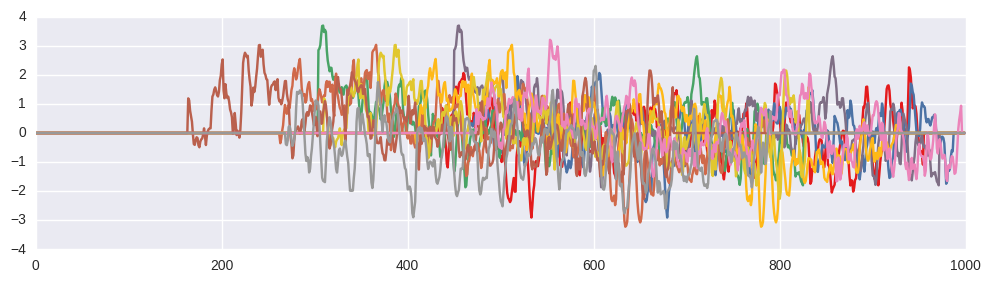

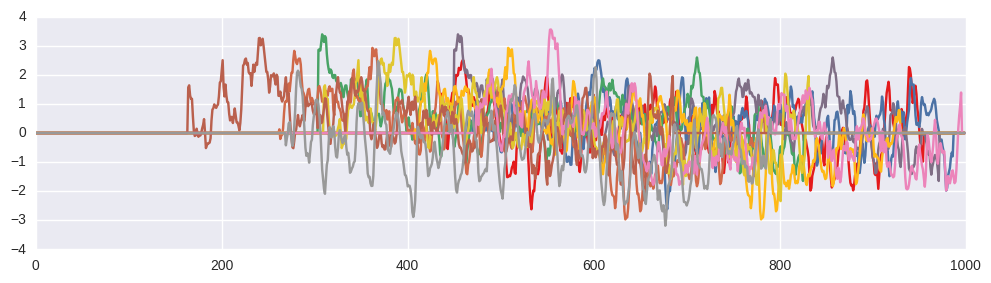

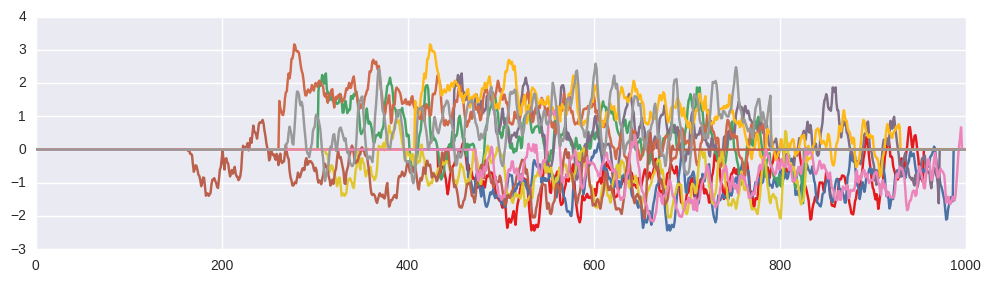

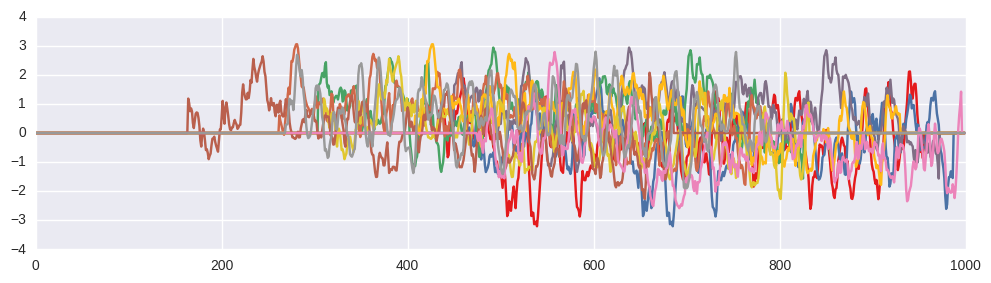

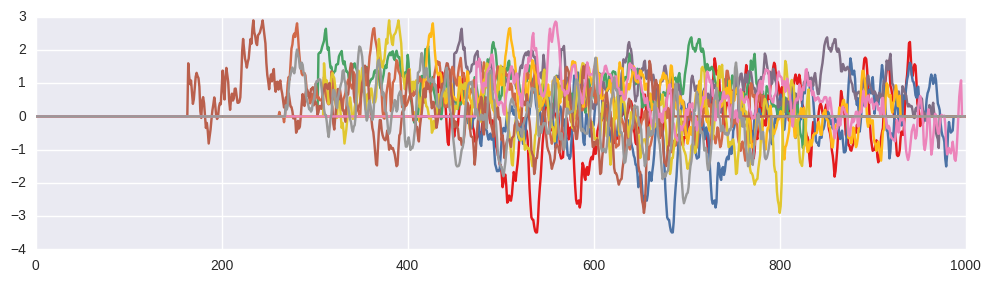

...

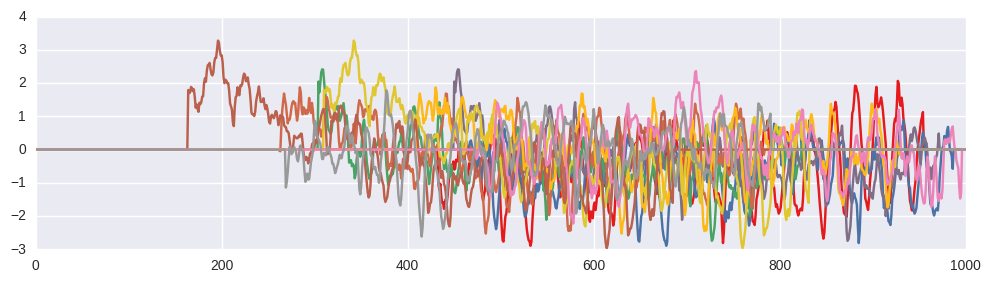

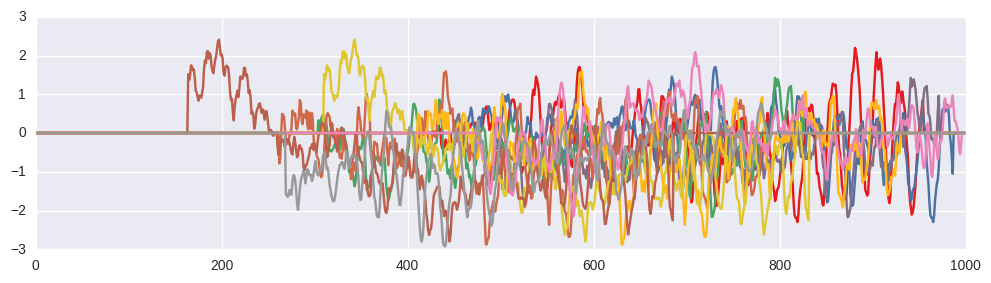

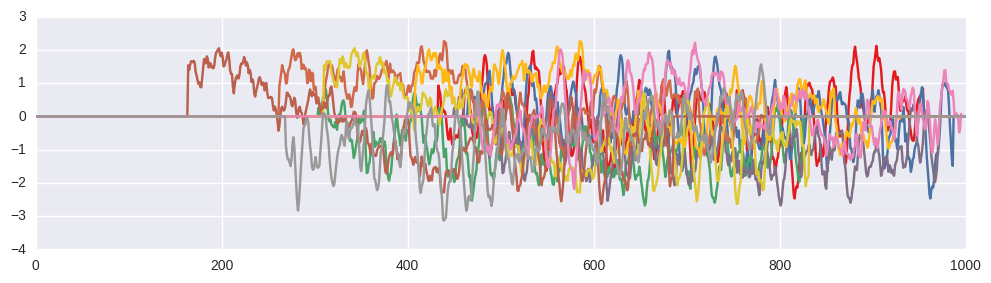

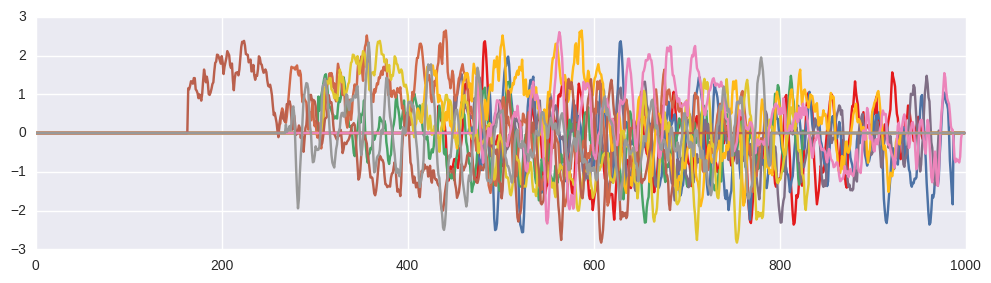

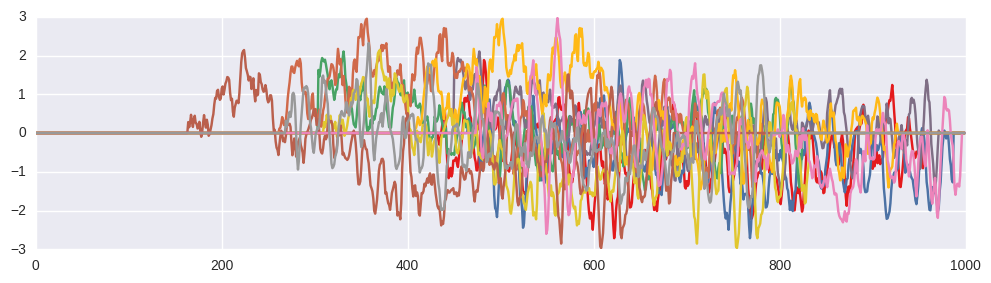

In [14]:
from cycler import cycler
color=cm.get_cmap('Set1')(np.linspace(0,1,X_RF.shape[0]))
for i in np.arange(X_RF.shape[1]):
    plt.gca().set_prop_cycle(cycler('color',color))
    plt.plot(X_RF[:,i,:,:].squeeze().T)
    plt.show()

In [14]:
%%capture
import os
import site
site.addsitedir('/home/schirrmr/.local/lib/python2.7/site-packages/')
site.addsitedir('/usr/lib/pymodules/python2.7/')
os.sys.path.insert(0, '/home/schirrmr/braindecode/code/')
%cd /home/schirrmr/braindecode/code/braindecode/
assert 'THEANO_FLAGS' in os.environ
# switch to cpu
#os.environ['THEANO_FLAGS'] = 'floatX=float32,device=cpu,nvcc.fastmath=True'
%load_ext autoreload
%autoreload 2
